# CNN(Convolutional Neural Network)

In [ ]:
# 파이썬 ≥3.5 필수
import sys
assert sys.version_info >= (3, 5)

# 사이킷런 ≥0.20 필수
import sklearn
assert sklearn.__version__ >= "0.20"

try:
    # %tensorflow_version은 코랩 명령입니다.
    %tensorflow_version 2.x
except Exception:
    pass

# 이 노트북은 텐서플로 ≥2.4이 필요합니다
# 2.x 버전은 대부분 동일한 결과를 만들지만 몇 가지 버그가 있습니다.
import tensorflow as tf
from tensorflow import keras
assert tf.__version__ >= "2.4"

# 공통 모듈 임포트
import numpy as np
import pandas as pd

import os

# 노트북 실행 결과를 동일하게 유지하기 위해
np.random.seed(42)
tf.random.set_seed(42)

# 깔끔한 그래프 출력을 위해
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# 그림을 저장할 위치
PROJECT_ROOT_DIR = "."
CHAPTER_ID = "CNN"
IMAGES_PATH = os.path.join(PROJECT_ROOT_DIR, "images", CHAPTER_ID)
os.makedirs(IMAGES_PATH, exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("그림 저장:", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)
    
import warnings
warnings.filterwarnings(action='ignore')

try:
    # %tensorflow_version only exists in Colab.
    %tensorflow_version 2.x
    IS_COLAB = True
except Exception:
    IS_COLAB = False
    
if not tf.config.list_physical_devices('GPU'):
    print("No GPU was detected. CNNs can be very slow without a GPU.")
    if IS_COLAB:
        print("Go to Runtime > Change runtime and select a GPU hardware accelerator.")


### 텐서플로 구현

#### 이미지 출력을 위한 함수

In [2]:
def plot_image(image):
    plt.imshow(image, cmap="gray", interpolation="nearest")
    plt.axis("off")

def plot_color_image(image):
    plt.imshow(image, interpolation="nearest")
    plt.axis("off")

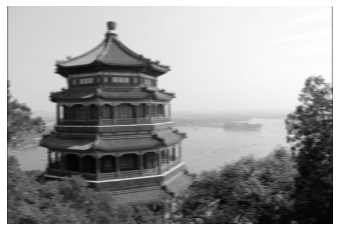

In [3]:
import numpy as np
from sklearn.datasets import load_sample_image

# Load sample images
china = load_sample_image("china.jpg") / 255
flower = load_sample_image("flower.jpg") / 255
images = np.array([china, flower])
batch_size, height, width, channels = images.shape

# Create 2 filters
filters = np.zeros(shape=(7, 7, channels, 2), dtype=np.float32)
filters[:, 3, :, 0] = 1  # vertical line
filters[3, :, :, 1] = 1  # horizontal line

outputs = tf.nn.conv2d(images, filters, strides=1, padding="SAME")

plt.imshow(outputs[0, :, :, 1], cmap="gray") # plot 1st image's 2nd feature map
plt.axis("off")
plt.show()

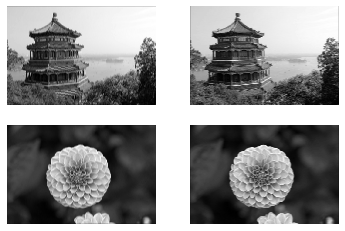

In [4]:
#이미지 출력
for image_index in (0, 1):
    for feature_map_index in (0, 1):
        plt.subplot(2, 2, image_index * 2 + feature_map_index + 1)
        plot_image(outputs[image_index, :, :, feature_map_index])

plt.show()

그림 저장: china_original


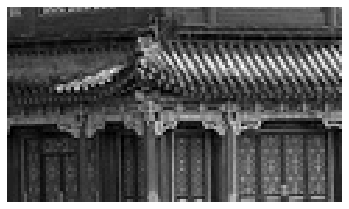

그림 저장: china_vertical


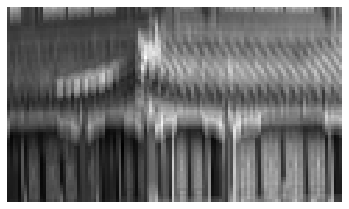

그림 저장: china_horizontal


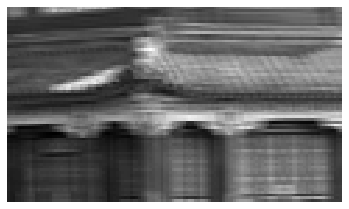

In [5]:
def crop(images):
    return images[150:220, 130:250]

plot_image(crop(images[0, :, :, 0]))
save_fig("china_original", tight_layout=False)
plt.show()

for feature_map_index, filename in enumerate(["china_vertical", "china_horizontal"]):
    plot_image(crop(outputs[0, :, :, feature_map_index]))
    save_fig(filename, tight_layout=False)
    plt.show()

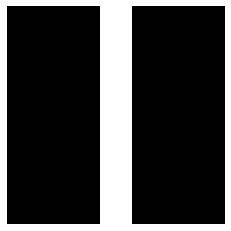

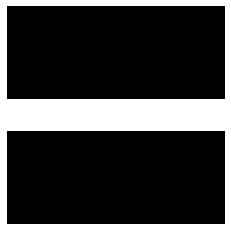

In [6]:
# 필터 확인
plot_image(filters[:, :, 0, 0])
plt.show()
plot_image(filters[:, :, 0, 1])
plt.show()

## 합성곱 신경망

In [7]:
conv = keras.layers.Conv2D(filters=32, kernel_size=3, strides=1,
                           padding="SAME", activation="relu")

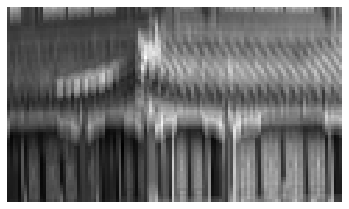

In [8]:
plot_image(crop(outputs[0, :, :, 0]))
plt.show()

## Pooling Layer

### Max Pooling

In [9]:
max_pool = keras.layers.MaxPool2D(pool_size=2)

In [10]:
cropped_images = np.array([crop(image) for image in images], dtype=np.float32)
output = max_pool(cropped_images)

그림 저장: china_max_pooling


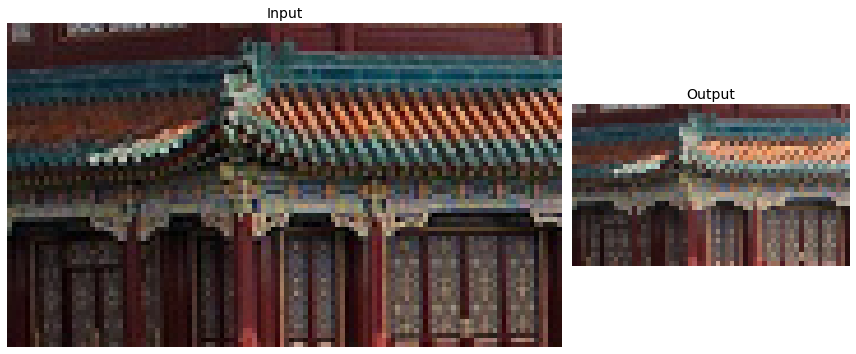

In [11]:
fig = plt.figure(figsize=(12, 8))
gs = mpl.gridspec.GridSpec(nrows=1, ncols=2, width_ratios=[2, 1])

ax1 = fig.add_subplot(gs[0, 0])
ax1.set_title("Input", fontsize=14)
ax1.imshow(cropped_images[0])  # plot the 1st image
ax1.axis("off")
ax2 = fig.add_subplot(gs[0, 1])
ax2.set_title("Output", fontsize=14)
ax2.imshow(output[0])  # plot the output for the 1st image
ax2.axis("off")
save_fig("china_max_pooling")
plt.show()

### Average Pooling

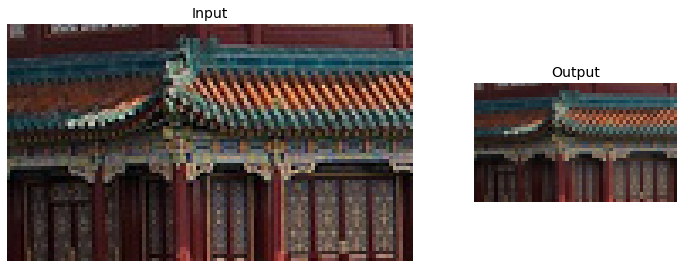

In [12]:
avg_pool = keras.layers.AvgPool2D(pool_size=2)

output_avg = avg_pool(cropped_images)

fig = plt.figure(figsize=(12, 8))
gs = mpl.gridspec.GridSpec(nrows=1, ncols=2, width_ratios=[2, 1])

ax1 = fig.add_subplot(gs[0, 0])
ax1.set_title("Input", fontsize=14)
ax1.imshow(cropped_images[0])  # plot the 1st image
ax1.axis("off")
ax2 = fig.add_subplot(gs[0, 1])
ax2.set_title("Output", fontsize=14)
ax2.imshow(output_avg[0])  # plot the output for the 1st image
ax2.axis("off")
plt.show()

### Depth-wise pooling

In [13]:
class DepthMaxPool(keras.layers.Layer):
    def __init__(self, pool_size, strides=None, padding="VALID", **kwargs):
        super().__init__(**kwargs)
        if strides is None:
            strides = pool_size
        self.pool_size = pool_size
        self.strides = strides
        self.padding = padding
    def call(self, inputs):
        return tf.nn.max_pool(inputs,
                              ksize=(1, 1, 1, self.pool_size),
                              strides=(1, 1, 1, self.pool_size),
                              padding=self.padding)

In [14]:
depth_pool = DepthMaxPool(3)
with tf.device("/cpu:0"): # there is no GPU-kernel yet
    depth_output = depth_pool(cropped_images)
depth_output.shape

TensorShape([2, 70, 120, 1])

In [15]:
depth_pool = keras.layers.Lambda(lambda X: tf.nn.max_pool(
    X, ksize=(1, 1, 1, 3), strides=(1, 1, 1, 3), padding="VALID"))
with tf.device("/cpu:0"): # there is no GPU-kernel yet
    depth_output = depth_pool(cropped_images)
depth_output.shape

TensorShape([2, 70, 120, 1])

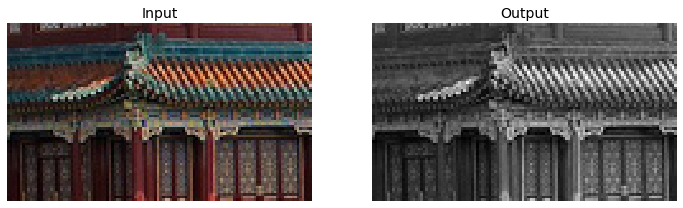

In [16]:
plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.title("Input", fontsize=14)
plot_color_image(cropped_images[0])  # plot the 1st image
plt.subplot(1, 2, 2)
plt.title("Output", fontsize=14)
plot_image(depth_output[0, ..., 0])  # plot the output for the 1st image
plt.axis("off")
plt.show()

### Global Average Pooling Layer

In [17]:
global_avg_pool = keras.layers.GlobalAvgPool2D()
global_avg_pool(cropped_images)

<tf.Tensor: shape=(2, 3), dtype=float32, numpy=
array([[0.2788801 , 0.22507527, 0.20967631],
       [0.51287866, 0.4595188 , 0.3342377 ]], dtype=float32)>

In [18]:
output_global_avg2 = keras.layers.Lambda(lambda X: tf.reduce_mean(X, axis=[1, 2]))
output_global_avg2(cropped_images)

<tf.Tensor: shape=(2, 3), dtype=float32, numpy=
array([[0.2788801 , 0.22507527, 0.20967631],
       [0.51287866, 0.4595188 , 0.3342377 ]], dtype=float32)>

## 합성곱 신경망을 이용한 패션 이미지 분류

### 데이터 불러오기

In [19]:
from tensorflow import keras
from sklearn.model_selection import train_test_split

(train_input, train_target), (test_input, test_target) = keras.datasets.fashion_mnist.load_data()

train_scaled = train_input.reshape(-1, 28, 28, 1) / 255.0

train_scaled, val_scaled, train_target, val_target = train_test_split(
    train_scaled, train_target, test_size=0.2, random_state=42)

### 합성곱 신경망 만들기

In [20]:
model = keras.Sequential()

model.add(keras.layers.Conv2D(32, kernel_size=3, activation='relu', padding='same', 
                              input_shape=(28,28,1)))

model.add(keras.layers.MaxPooling2D(2))

model.add(keras.layers.Conv2D(64, kernel_size=(3,3), activation='relu', padding='same'))
model.add(keras.layers.MaxPooling2D(2))

model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(100, activation='relu'))
model.add(keras.layers.Dropout(0.4))
model.add(keras.layers.Dense(10, activation='softmax'))

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 28, 28, 32)        320       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 14, 14, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 14, 14, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 7, 7, 64)          0         
_________________________________________________________________
flatten (Flatten)            (None, 3136)              0         
_________________________________________________________________
dense (Dense)                (None, 100)               313700    
_________________________________________________________________
dropout (Dropout)            (None, 100)               0

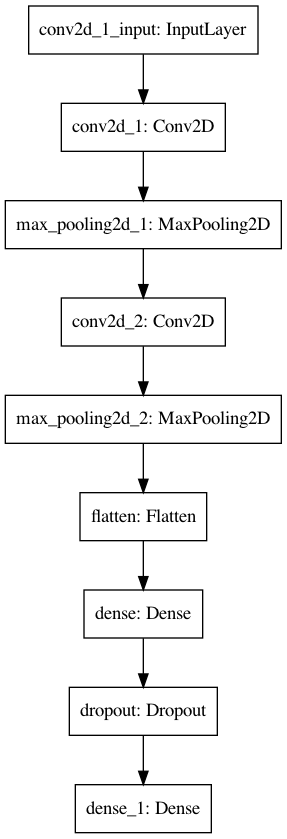

In [21]:
keras.utils.plot_model(model)

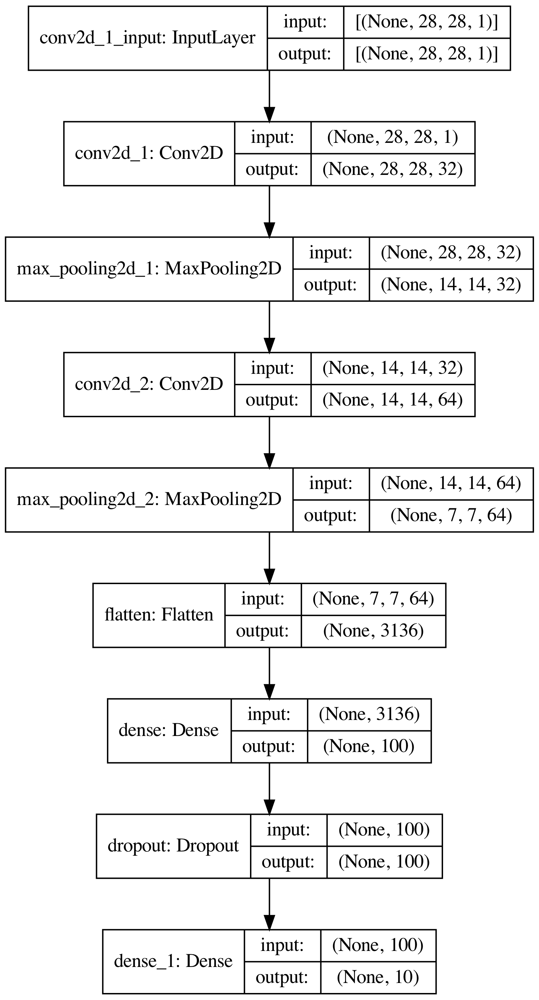

In [22]:
keras.utils.plot_model(model, show_shapes=True, to_file='cnn-architecture.png', dpi=300)

### 모델 컴파일 과 훈련

In [23]:
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics='accuracy')

checkpoint_cb = keras.callbacks.ModelCheckpoint('best-cnn-model.h5')
early_stopping_cb = keras.callbacks.EarlyStopping(patience=2,
                                                  restore_best_weights=True)

history = model.fit(train_scaled, train_target, epochs=20,
                    validation_data=(val_scaled, val_target),
                    callbacks=[checkpoint_cb, early_stopping_cb])


Epoch 1/20
1500/1500 [==============================] - 22s 14ms/step - loss: 0.5415 - accuracy: 0.8065 - val_loss: 0.3291 - val_accuracy: 0.8804
Epoch 2/20
1500/1500 [==============================] - 22s 15ms/step - loss: 0.3578 - accuracy: 0.8718 - val_loss: 0.2781 - val_accuracy: 0.8957
Epoch 3/20
1500/1500 [==============================] - 22s 15ms/step - loss: 0.3051 - accuracy: 0.8896 - val_loss: 0.2702 - val_accuracy: 0.8979
Epoch 4/20
1500/1500 [==============================] - 23s 15ms/step - loss: 0.2725 - accuracy: 0.9019 - val_loss: 0.2386 - val_accuracy: 0.9122
Epoch 5/20
1500/1500 [==============================] - 23s 15ms/step - loss: 0.2446 - accuracy: 0.9107 - val_loss: 0.2457 - val_accuracy: 0.9123
Epoch 6/20
1500/1500 [==============================] - 23s 15ms/step - loss: 0.2265 - accuracy: 0.9175 - val_loss: 0.2199 - val_accuracy: 0.9168
Epoch 7/20
1500/1500 [==============================] - 23s 15ms/step - loss: 0.2110 - accuracy: 0.9218 - val_loss: 0.2245 -

### 손실 함수 출력

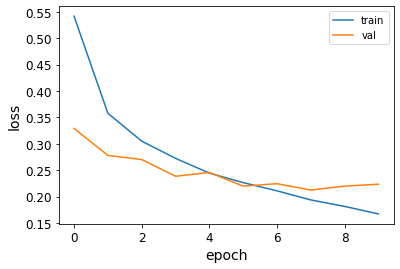

In [24]:
import matplotlib.pyplot as plt

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['train', 'val'])
plt.show()

### 모델 평가 와 예측

In [25]:
model.evaluate(val_scaled, val_target)

375/375 [==============================] - 1s 3ms/step - loss: 0.2125 - accuracy: 0.9256


[0.21251055598258972, 0.9255833625793457]

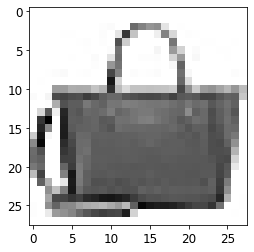

In [26]:
plt.imshow(val_scaled[0].reshape(28, 28), cmap='gray_r')
plt.show()

In [27]:
preds = model.predict(val_scaled[0:1])
print(preds)

[[1.0417666e-12 2.1875858e-23 7.8535783e-17 3.4195821e-16 2.3791631e-15
  1.4755375e-16 4.0321124e-16 2.2906911e-15 1.0000000e+00 2.0116035e-16]]


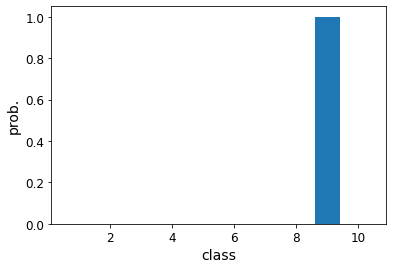

In [28]:
plt.bar(range(1, 11), preds[0])
plt.xlabel('class')
plt.ylabel('prob.')
plt.show()

In [29]:
classes = ['티셔츠', '바지', '스웨터', '드레스', '코트',
           '샌달', '셔츠', '스니커즈', '가방', '앵클 부츠']

In [30]:
import numpy as np
print(classes[np.argmax(preds)])

가방


In [31]:
test_scaled = test_input.reshape(-1, 28, 28, 1) / 255.0

In [32]:
model.evaluate(test_scaled, test_target)

313/313 [==============================] - 1s 3ms/step - loss: 0.2354 - accuracy: 0.9193


[0.23542368412017822, 0.9193000197410583]

In [33]:
model.save('best-cnn-model.h5')

## 합성곱 신경망의 시각화

### 이전 모델 가져오기

In [34]:
model = keras.models.load_model('best-cnn-model.h5')

In [35]:
model.layers

### 가중치 확인

In [36]:
conv = model.layers[0]

print(conv.weights[0].shape, conv.weights[1].shape)

(3, 3, 1, 32) (32,)


In [37]:
conv_weights = conv.weights[0].numpy()

print(conv_weights.mean(), conv_weights.std())

-0.02647547 0.26366743


### 가중치 분포 확인

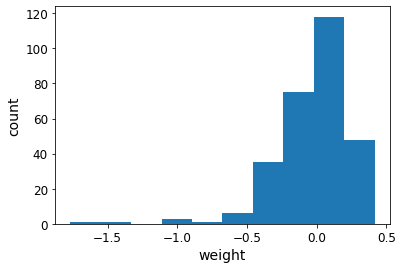

In [38]:
import matplotlib.pyplot as plt

plt.hist(conv_weights.reshape(-1, 1))
plt.xlabel('weight')
plt.ylabel('count')
plt.show()

### 32개 커널을 16개씩 출력

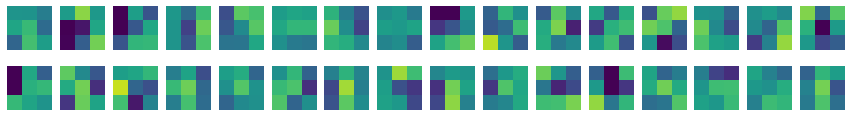

In [39]:
fig, axs = plt.subplots(2, 16, figsize=(15,2))

for i in range(2):
    for j in range(16):
        axs[i, j].imshow(conv_weights[:,:,0,i*16 + j], vmin=-0.5, vmax=0.5)
        axs[i, j].axis('off')

plt.show()

### 훈련하지 않은 빈 신경망 생성

In [40]:
no_training_model = keras.Sequential()

no_training_model.add(keras.layers.Conv2D(32, kernel_size=3, activation='relu', 
                                          padding='same', input_shape=(28,28,1)))

### 첫번째 층의 가중치를 저장

In [41]:
no_training_conv = no_training_model.layers[0]

print(no_training_conv.weights[0].shape)

(3, 3, 1, 32)


### 가중치의 평균 과 표준편차

In [42]:
no_training_weights = no_training_conv.weights[0].numpy()

print(no_training_weights.mean(), no_training_weights.std())

0.001513531 0.084175035


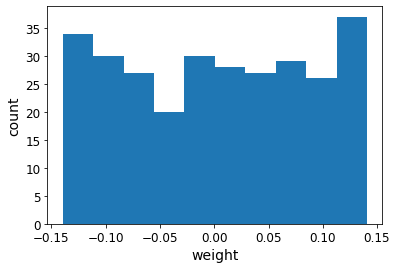

In [43]:
plt.hist(no_training_weights.reshape(-1, 1))
plt.xlabel('weight')
plt.ylabel('count')
plt.show()

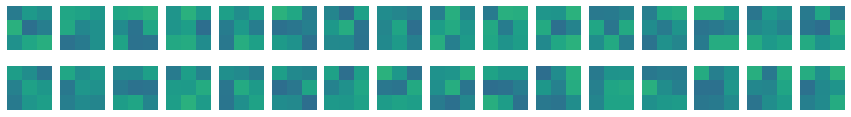

In [44]:
fig, axs = plt.subplots(2, 16, figsize=(15,2))

for i in range(2):
    for j in range(16):
        axs[i, j].imshow(no_training_weights[:,:,0,i*16 + j], vmin=-0.5, vmax=0.5)
        axs[i, j].axis('off')

plt.show()

## 함수형 API 사용

In [45]:
conv_acti = keras.models.Model(model.input, model.layers[0].output)

## 특성 맵 시각화

### 첫번째 샘플 출력

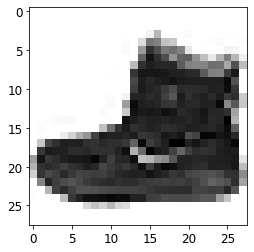

In [46]:
(train_input, train_target), (test_input, test_target) = keras.datasets.fashion_mnist.load_data()

plt.imshow(train_input[0], cmap='gray_r')
plt.show()

In [47]:
inputs = train_input[0:1].reshape(-1, 28, 28, 1)/255.0
feature_maps = conv_acti.predict(inputs)
print(feature_maps.shape)

(1, 28, 28, 32)


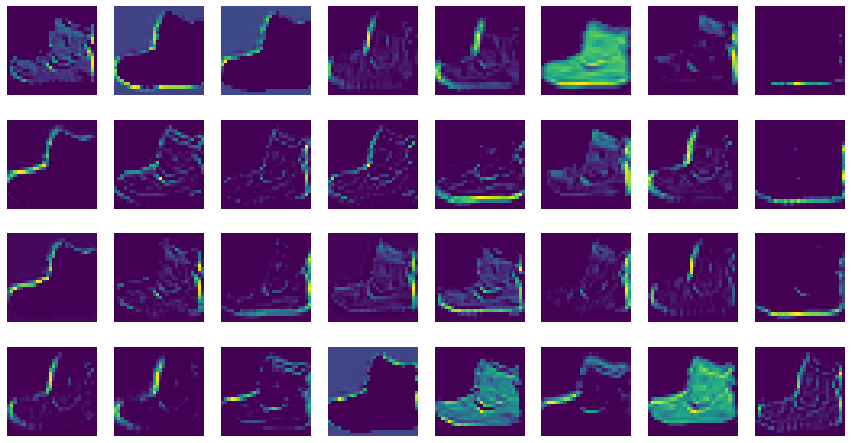

In [48]:
fig, axs = plt.subplots(4, 8, figsize=(15,8))

for i in range(4):
    for j in range(8):
        axs[i, j].imshow(feature_maps[0,:,:,i*8 + j])
        axs[i, j].axis('off')

plt.show()

(1, 14, 14, 64)


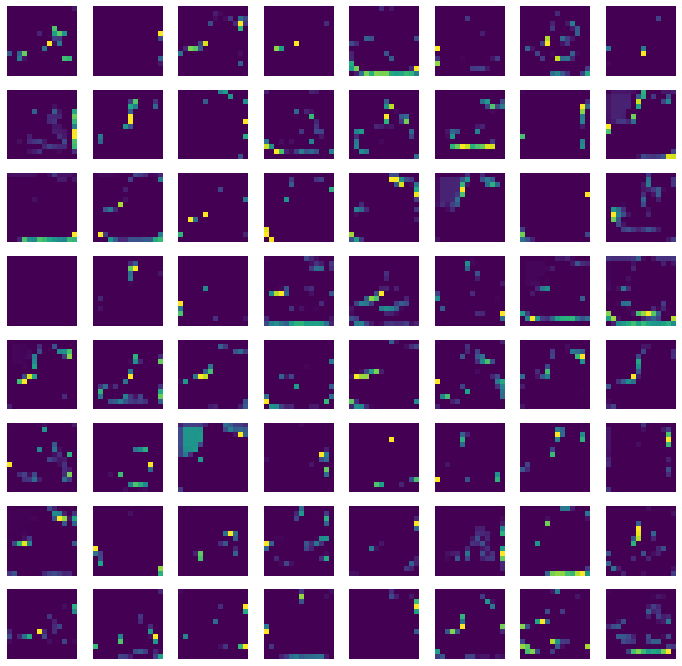

In [49]:
conv2_acti = keras.models.Model(model.input, model.layers[2].output)

feature_maps = conv2_acti.predict(train_input[0:1].reshape(-1, 28, 28, 1)/255.0)

print(feature_maps.shape)

fig, axs = plt.subplots(8, 8, figsize=(12,12))

for i in range(8):
    for j in range(8):
        axs[i, j].imshow(feature_maps[0,:,:,i*8 + j])
        axs[i, j].axis('off')

plt.show()

## CNN 을 활용한 교통 표지판 인식

### 데이터 가져오고 전처리

In [50]:
N_CLASSES = 43
RESIZED_IMAGE = (32, 32)

import matplotlib.pyplot as plt
import glob
from skimage.color import rgb2lab
from skimage.transform import resize
from collections import namedtuple
import numpy as np
np.random.seed(101)
%matplotlib inline

Dataset = namedtuple('Dataset', ['X', 'y'])

def to_tf_format(imgs):
    return np.stack([img[:, :, np.newaxis] for img in imgs], axis=0).astype(np.float32)

def read_dataset_ppm(rootpath, n_labels, resize_to):
  images = []
  labels = []
  
  for c in range(n_labels):
    full_path = rootpath + '/' + format(c, '05d') + '/'
    for img_name in glob.glob(full_path + "*.ppm"):
      
      img = plt.imread(img_name).astype(np.float32)
      img = rgb2lab(img / 255.0)[:,:,0]
      if resize_to:
        img = resize(img, resize_to, mode='reflect')
      
      label = np.zeros((n_labels, ), dtype=np.float32)
      label[c] = 1.0
      
      images.append(img.astype(np.float32))
      labels.append(label)

  return Dataset(X = to_tf_format(images).astype(np.float32),
                 y = np.matrix(labels).astype(np.float32))

dataset = read_dataset_ppm('./data/GTSRB/Final_Training/Images', N_CLASSES, RESIZED_IMAGE)
print(dataset.X.shape)
print(dataset.y.shape)

(39209, 32, 32, 1)
(39209, 43)


### 이미지 출력

[[1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]


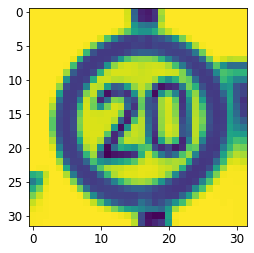

In [51]:
plt.imshow(dataset.X[0, :, :, :].reshape(RESIZED_IMAGE)) #sample
print(dataset.y[0, :]) #label

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]


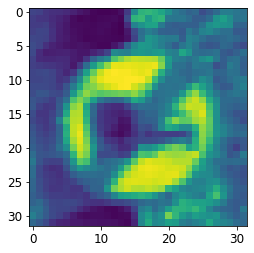

In [52]:
plt.imshow(dataset.X[-1, :, :, :].reshape(RESIZED_IMAGE)) #sample
print(dataset.y[-1, :]) #label

### 훈련 데이터 와 테스트 데이터 생성

In [53]:
from sklearn.model_selection import train_test_split
idx_train, idx_test = train_test_split(range(dataset.X.shape[0]), test_size=0.25, random_state=101)
X_train = dataset.X[idx_train, :, :, :]
X_test = dataset.X[idx_test, :, :, :]
y_train = dataset.y[idx_train, :]
y_test = dataset.y[idx_test, :]

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

ar = []


ar = []
for i in np.asarray(y_train):
    for k, j in enumerate(i):
       if j == 1:
            ar.append(k)
y_train = np.array(ar)

ar = []
for i in np.asarray(y_test):
    for k, j in enumerate(i):
       if j == 1:
            ar.append(k)
y_test = np.array(ar)


(29406, 32, 32, 1)
(29406, 43)
(9803, 32, 32, 1)
(9803, 43)


### 신경망 생성

In [54]:
model = keras.Sequential()

model.add(keras.layers.Conv2D(32, kernel_size=3, activation='relu', padding='same', 
                              input_shape=(32,32,1)))

model.add(keras.layers.MaxPooling2D(2))

model.add(keras.layers.Conv2D(64, kernel_size=(3,3), activation='relu', padding='same'))
model.add(keras.layers.MaxPooling2D(2))

model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(100, activation='relu'))
model.add(keras.layers.Dropout(0.4))

model.add(keras.layers.Dense(43, activation='softmax'))

model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 32, 32, 32)        320       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 16, 16, 64)        18496     
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 8, 8, 64)          0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 4096)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 100)               409700    
_________________________________________________________________
dropout_1 (Dropout)          (None, 100)              

### 모델 훈련

In [55]:
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics='accuracy')

checkpoint_cb = keras.callbacks.ModelCheckpoint('best-cnn-model.h5')
early_stopping_cb = keras.callbacks.EarlyStopping(patience=2,
                                                  restore_best_weights=True)

history = model.fit(X_train, y_train, epochs=20,
                    callbacks=[checkpoint_cb, early_stopping_cb])


Epoch 1/20
919/919 [==============================] - 18s 19ms/step - loss: 3.6741 - accuracy: 0.0551
Epoch 2/20
919/919 [==============================] - 18s 19ms/step - loss: 3.5263 - accuracy: 0.0572
Epoch 3/20
919/919 [==============================] - 16s 18ms/step - loss: 3.4970 - accuracy: 0.0567
Epoch 4/20
919/919 [==============================] - 16s 17ms/step - loss: 3.4899 - accuracy: 0.0579
Epoch 5/20
919/919 [==============================] - 16s 17ms/step - loss: 3.4878 - accuracy: 0.0562
Epoch 6/20
919/919 [==============================] - 16s 18ms/step - loss: 3.4869 - accuracy: 0.0571
Epoch 7/20
919/919 [==============================] - 16s 17ms/step - loss: 3.4869 - accuracy: 0.0557
Epoch 8/20
919/919 [==============================] - 16s 18ms/step - loss: 3.4867 - accuracy: 0.0561
Epoch 9/20
919/919 [==============================] - 17s 18ms/step - loss: 3.4871 - accuracy: 0.0564
Epoch 10/20
919/919 [==============================] - 16s 17ms/step - loss: 3.487

## CNN을 활용한 MNIST 이미지 분류

### 데이터 가져오기

In [56]:
mnist = tf.keras.datasets.mnist
(x_train, y_train), (x_valid, y_valid) = mnist.load_data()

print(x_train.shape, y_train.shape)
print(x_valid.shape, y_valid.shape)

(60000, 28, 28) (60000,)
(10000, 28, 28) (10000,)


### 샘플 이미지 출력

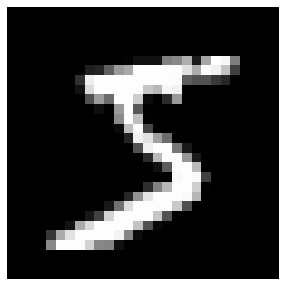

In [57]:
import matplotlib.pylab as plt

def plot_image(data, idx):
    plt.figure(figsize=(5, 5))
    plt.imshow(data[idx], cmap="gray")
    plt.axis("off")
    plt.show()

plot_image(x_train, 0)

### 값의 범위 확인

In [58]:
print(x_train.min(), x_train.max())
print(x_valid.min(), x_valid.max())

0 255
0 255


### 정규화

In [59]:
x_train = x_train / 255.0
x_valid = x_valid / 255.0

print(x_train.min(), x_train.max())
print(x_valid.min(), x_valid.max())

0.0 1.0
0.0 1.0


### 채널 추가

In [60]:
# 채널 추가
print(x_train.shape, x_valid.shape)

x_train_in = x_train[..., tf.newaxis]
x_valid_in = x_valid[..., tf.newaxis]

print(x_train_in.shape, x_valid_in.shape)

(60000, 28, 28) (10000, 28, 28)
(60000, 28, 28, 1) (10000, 28, 28, 1)


### CNN 생성

In [61]:
# Sequential API를 사용하여 샘플 모델 생성
model = tf.keras.Sequential([
    # Convolution 적용 (32 filters)
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', 
                           input_shape=(28, 28, 1), name='conv'),
    # Max Pooling 적용
    tf.keras.layers.MaxPooling2D((2, 2), name='pool'),
    # Classifier 출력층 
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(10, activation='softmax'),
])

### 모델 컴파일 및 훈련

In [62]:
# 모델 컴파일
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# 모델 훈련
history = model.fit(x_train_in, y_train, 
                    validation_data=(x_valid_in, y_valid), 
                    epochs=10)

Epoch 1/10
1875/1875 [==============================] - 9s 5ms/step - loss: 0.2137 - accuracy: 0.9390 - val_loss: 0.0941 - val_accuracy: 0.9714
Epoch 2/10
1875/1875 [==============================] - 8s 4ms/step - loss: 0.0778 - accuracy: 0.9779 - val_loss: 0.0643 - val_accuracy: 0.9794
Epoch 3/10
1875/1875 [==============================] - 7s 4ms/step - loss: 0.0585 - accuracy: 0.9828 - val_loss: 0.0549 - val_accuracy: 0.9823
Epoch 4/10
1875/1875 [==============================] - 7s 4ms/step - loss: 0.0479 - accuracy: 0.9852 - val_loss: 0.0541 - val_accuracy: 0.9820
Epoch 5/10
1875/1875 [==============================] - 8s 4ms/step - loss: 0.0403 - accuracy: 0.9877 - val_loss: 0.0537 - val_accuracy: 0.9833
Epoch 6/10
1875/1875 [==============================] - 8s 4ms/step - loss: 0.0342 - accuracy: 0.9899 - val_loss: 0.0537 - val_accuracy: 0.9837
Epoch 7/10
1875/1875 [==============================] - 8s 4ms/step - loss: 0.0296 - accuracy: 0.9912 - val_loss: 0.0509 - val_accuracy:

### 모델 평가

In [63]:
model.evaluate(x_valid_in, y_valid)

313/313 [==============================] - 0s 1ms/step - loss: 0.0576 - accuracy: 0.9833


[0.057565320283174515, 0.983299970626831]

### 손실과 정밀도 그래프

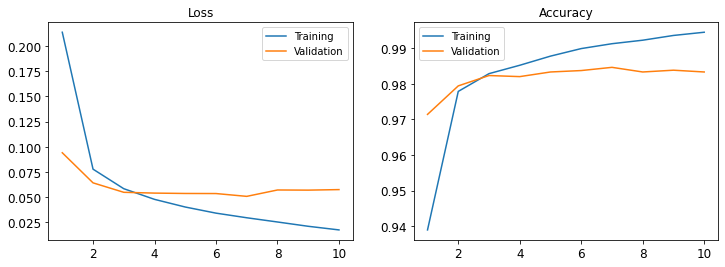

In [64]:
def plot_loss_acc(history, epoch):

    loss, val_loss = history.history['loss'], history.history['val_loss']
    acc, val_acc = history.history['accuracy'], history.history['val_accuracy']

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    axes[0].plot(range(1, epoch + 1), loss, label='Training')
    axes[0].plot(range(1, epoch + 1), val_loss, label='Validation')
    axes[0].legend(loc='best')
    axes[0].set_title('Loss')

    axes[1].plot(range(1, epoch + 1), acc, label='Training')
    axes[1].plot(range(1, epoch + 1), val_acc, label='Validation')
    axes[1].legend(loc='best')
    axes[1].set_title('Accuracy')

    plt.show()

plot_loss_acc(history, 10)

## 함수형 API 를 이용한 다중 분류

### 새로운 출력 생성 - 홀수:1, 짝수:0

In [65]:
# 새로운 출력값 배열을 생성 (홀수: 1, 짝수: 0)
y_train_odd = []
for y in y_train:
    if y % 2==0:
        y_train_odd.append(0)
    else:
        y_train_odd.append(1)

y_train_odd = np.array(y_train_odd)
y_train_odd.shape

(60000,)

In [66]:
print(y_train[:10])
print(y_train_odd[:10])

[5 0 4 1 9 2 1 3 1 4]
[1 0 0 1 1 0 1 1 1 0]


### 검증 데이터 처리

In [67]:
# Validation 데이터셋 처리
y_valid_odd = []
for y in y_valid:
    if y % 2==0:
        y_valid_odd.append(0)
    else:
        y_valid_odd.append(1)

y_valid_odd = np.array(y_valid_odd)
y_valid_odd.shape

(10000,)

### 데이터 전처리

In [68]:
# 정규화(Normalization)
x_train = x_train / 255.0
x_valid = x_valid / 255.0

# 채널 추가
x_train_in = tf.expand_dims(x_train, -1)
x_valid_in = tf.expand_dims(x_valid, -1)

print(x_train_in.shape, x_valid_in.shape)

(60000, 28, 28, 1) (10000, 28, 28, 1)


### Functional API 를 이용하여 다중 입력 및 다중 출력 모델 생성

In [69]:
# Functional API를 사용하여 모델 생성

inputs = tf.keras.layers.Input(shape=(28, 28, 1))

conv = tf.keras.layers.Conv2D(32, (3, 3), activation='relu')(inputs)
pool = tf.keras.layers.MaxPooling2D((2, 2))(conv)
flat = tf.keras.layers.Flatten()(pool)

flat_inputs = tf.keras.layers.Flatten()(inputs)
concat = tf.keras.layers.Concatenate()([flat, flat_inputs])
outputs = tf.keras.layers.Dense(10, activation='softmax')(concat)

model = tf.keras.models.Model(inputs=inputs, outputs=outputs)

model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 28, 28, 1)]  0                                            
__________________________________________________________________________________________________
conv2d_6 (Conv2D)               (None, 26, 26, 32)   320         input_1[0][0]                    
__________________________________________________________________________________________________
max_pooling2d_5 (MaxPooling2D)  (None, 13, 13, 32)   0           conv2d_6[0][0]                   
__________________________________________________________________________________________________
flatten_3 (Flatten)             (None, 5408)         0           max_pooling2d_5[0][0]            
____________________________________________________________________________________________

### 모델 구조 출력 및 이미지 파일로 저장

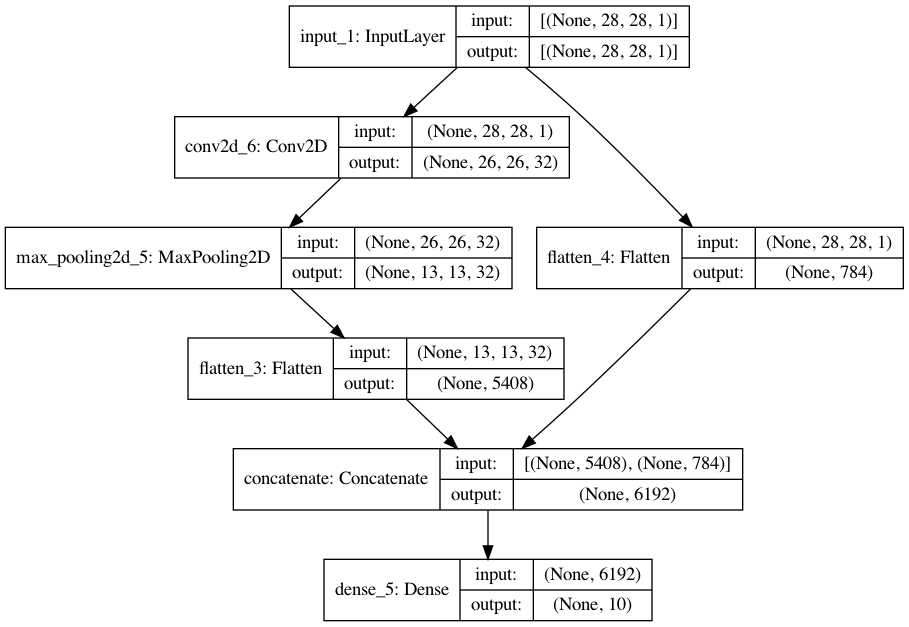

In [70]:
from tensorflow.python.keras.utils.vis_utils import plot_model
plot_model(model, show_shapes=True, show_layer_names=True, to_file='functional_cnn.png')

### 모델 컴파일 및 훈련 과 평가

In [71]:
# 모델 컴파일
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# 모델 훈련
history = model.fit(x_train_in, y_train, 
                    validation_data=(x_valid_in, y_valid), 
                    epochs=10)

# 모델 성능
val_loss, val_acc = model.evaluate(x_valid_in, y_valid)
print(val_loss, val_acc)

Epoch 1/10
1875/1875 [==============================] - 11s 5ms/step - loss: 1.0904 - accuracy: 0.7417 - val_loss: 0.4712 - val_accuracy: 0.8715
Epoch 2/10
1875/1875 [==============================] - 10s 5ms/step - loss: 0.4139 - accuracy: 0.8826 - val_loss: 0.3543 - val_accuracy: 0.9011
Epoch 3/10
1875/1875 [==============================] - 10s 5ms/step - loss: 0.3491 - accuracy: 0.8978 - val_loss: 0.3199 - val_accuracy: 0.9099
Epoch 4/10
1875/1875 [==============================] - 10s 5ms/step - loss: 0.3252 - accuracy: 0.9044 - val_loss: 0.3075 - val_accuracy: 0.9103
Epoch 5/10
1875/1875 [==============================] - 9s 5ms/step - loss: 0.3124 - accuracy: 0.9086 - val_loss: 0.2935 - val_accuracy: 0.9153
Epoch 6/10
1875/1875 [==============================] - 10s 5ms/step - loss: 0.3034 - accuracy: 0.9117 - val_loss: 0.2850 - val_accuracy: 0.9159
Epoch 7/10
1875/1875 [==============================] - 10s 5ms/step - loss: 0.2967 - accuracy: 0.9136 - val_loss: 0.2847 - val_acc

### Multi Output 모델

In [72]:
# Functional API를 사용하여 모델 생성

inputs = tf.keras.layers.Input(shape=(28, 28, 1), name='inputs')

conv = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', name='conv2d_layer')(inputs)
pool = tf.keras.layers.MaxPooling2D((2, 2), name='maxpool_layer')(conv)
flat = tf.keras.layers.Flatten(name='flatten_layer')(pool)

flat_inputs = tf.keras.layers.Flatten()(inputs)
concat = tf.keras.layers.Concatenate()([flat, flat_inputs])
digit_outputs = tf.keras.layers.Dense(10, activation='softmax', name='digit_dense')(concat)

odd_outputs = tf.keras.layers.Dense(1, activation='sigmoid', name='odd_dense')(flat_inputs)

model = tf.keras.models.Model(inputs=inputs, outputs=[digit_outputs, odd_outputs])

model.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
inputs (InputLayer)             [(None, 28, 28, 1)]  0                                            
__________________________________________________________________________________________________
conv2d_layer (Conv2D)           (None, 26, 26, 32)   320         inputs[0][0]                     
__________________________________________________________________________________________________
maxpool_layer (MaxPooling2D)    (None, 13, 13, 32)   0           conv2d_layer[0][0]               
__________________________________________________________________________________________________
flatten_layer (Flatten)         (None, 5408)         0           maxpool_layer[0][0]              
____________________________________________________________________________________________

### 모델의 입력과 출력을 나타내는 텐서

In [73]:
print(model.input)
print(model.output)

KerasTensor(type_spec=TensorSpec(shape=(None, 28, 28, 1), dtype=tf.float32, name='inputs'), name='inputs', description="created by layer 'inputs'")
[<KerasTensor: shape=(None, 10) dtype=float32 (created by layer 'digit_dense')>, <KerasTensor: shape=(None, 1) dtype=float32 (created by layer 'odd_dense')>]


### 모델 구조 이미지 저장

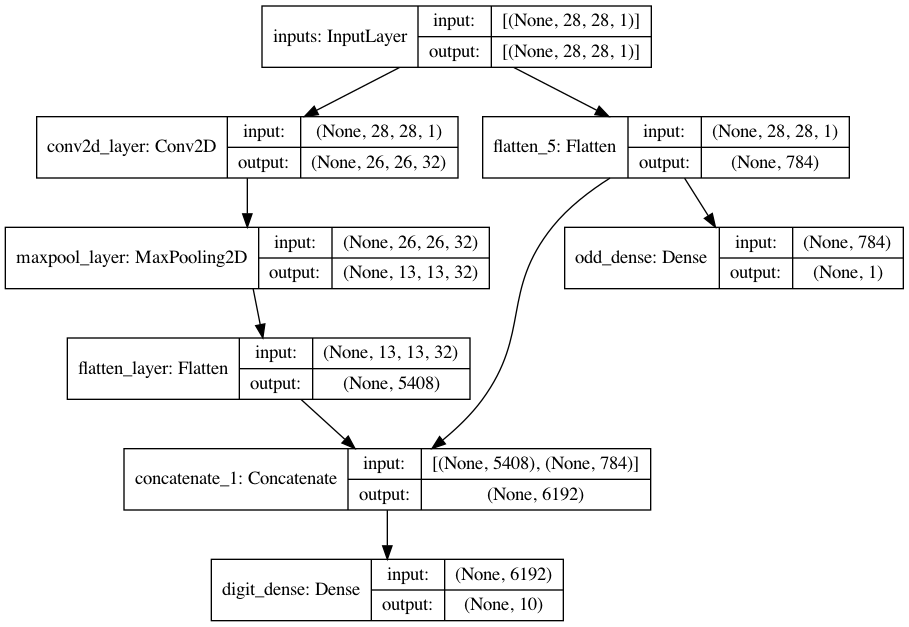

In [74]:
plot_model(model, show_shapes=True, show_layer_names=True, to_file='multi_output_cnn.png')

### 모델 컴파일 및 훈련

In [75]:
# 모델 컴파일
model.compile(optimizer='adam', 
              loss={'digit_dense': 'sparse_categorical_crossentropy', 'odd_dense': 'binary_crossentropy'}, 
              loss_weights={'digit_dense': 1, 'odd_dense': 0.5}, # loss = 1.0 *sparse_categorical_crossentropy + 0.5*binary_crossentropy
              metrics=['accuracy'])

# 모델 훈련
history = model.fit({'inputs': x_train_in}, {'digit_dense': y_train, 'odd_dense': y_train_odd}, 
                    validation_data=({'inputs': x_valid_in},  {'digit_dense': y_valid, 'odd_dense': y_valid_odd}), 
                    epochs=10)

Epoch 1/10
1875/1875 [==============================] - 10s 5ms/step - loss: 1.4944 - digit_dense_loss: 1.1595 - odd_dense_loss: 0.6698 - digit_dense_accuracy: 0.7298 - odd_dense_accuracy: 0.7575 - val_loss: 0.8287 - val_digit_dense_loss: 0.5057 - val_odd_dense_loss: 0.6460 - val_digit_dense_accuracy: 0.8647 - val_odd_dense_accuracy: 0.7976
Epoch 2/10
1875/1875 [==============================] - 10s 5ms/step - loss: 0.7485 - digit_dense_loss: 0.4347 - odd_dense_loss: 0.6276 - digit_dense_accuracy: 0.8784 - odd_dense_accuracy: 0.7976 - val_loss: 0.6712 - val_digit_dense_loss: 0.3681 - val_odd_dense_loss: 0.6061 - val_digit_dense_accuracy: 0.8969 - val_odd_dense_accuracy: 0.8009
Epoch 3/10
1875/1875 [==============================] - 10s 5ms/step - loss: 0.6546 - digit_dense_loss: 0.3587 - odd_dense_loss: 0.5919 - digit_dense_accuracy: 0.8946 - odd_dense_accuracy: 0.8018 - val_loss: 0.6136 - val_digit_dense_loss: 0.3274 - val_odd_dense_loss: 0.5725 - val_digit_dense_accuracy: 0.9061 - va

### 모델 평가

In [76]:
model.evaluate({'inputs': x_valid_in}, {'digit_dense': y_valid, 'odd_dense': y_valid_odd})

313/313 [==============================] - 1s 2ms/step - loss: 0.4941 - digit_dense_loss: 0.2730 - odd_dense_loss: 0.4422 - digit_dense_accuracy: 0.9208 - odd_dense_accuracy: 0.8264


[0.49412861466407776,
 0.27302852272987366,
 0.4422004520893097,
 0.920799970626831,
 0.8263999819755554]

### 샘플 이미지 출력

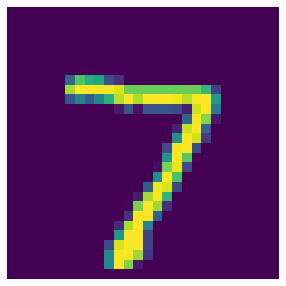

In [77]:
import matplotlib.pylab as plt

def plot_image(data, idx):
    plt.figure(figsize=(5, 5))
    plt.imshow(data[idx])
    plt.axis("off")
    plt.show()

plot_image(x_valid, 0)

### 모델 예측

In [78]:
digit_preds, odd_preds = model.predict(x_valid_in)
print(digit_preds[0])
print(odd_preds[0])

[5.8864310e-07 3.4647570e-11 1.2470313e-06 1.9436277e-04 6.3521640e-08
 2.9406569e-06 6.2940715e-11 9.9958318e-01 2.6834869e-07 2.1726493e-04]
[0.82301235]


In [79]:
digit_labels = np.argmax(digit_preds, axis=-1)
digit_labels[0:10]

array([7, 2, 1, 0, 4, 1, 4, 9, 6, 9])

In [80]:
odd_labels = (odd_preds > 0.5).astype(np.int).reshape(1, -1)[0]
odd_labels[0:10]

array([1, 0, 1, 0, 0, 1, 1, 1, 0, 1])

## 전이학습

### 이전 모델을 이용해서 새로운 모델 생성

In [81]:
# 앞의 모델에서 flatten_layer 출력을 추출
base_model_output = model.get_layer('flatten_layer').output

# 앞의 출력을 출력으로 하는 모델 정의
base_model = tf.keras.models.Model(inputs=model.input, outputs=base_model_output, name='base')
base_model.summary()

Model: "base"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inputs (InputLayer)          [(None, 28, 28, 1)]       0         
_________________________________________________________________
conv2d_layer (Conv2D)        (None, 26, 26, 32)        320       
_________________________________________________________________
maxpool_layer (MaxPooling2D) (None, 13, 13, 32)        0         
_________________________________________________________________
flatten_layer (Flatten)      (None, 5408)              0         
Total params: 320
Trainable params: 320
Non-trainable params: 0
_________________________________________________________________


### 모델 구조 저장

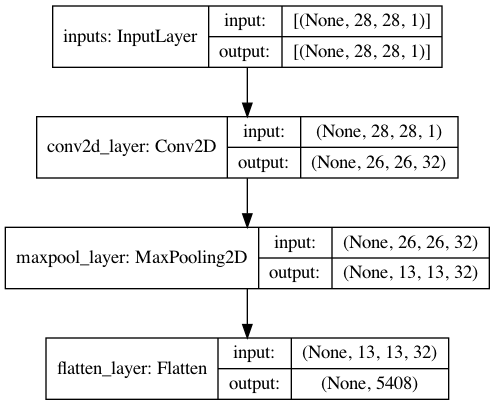

In [82]:
plot_model(base_model, show_shapes=True, show_layer_names=True, to_file='base_model.png')

### 모델 생성

In [83]:
# Sequential API 적용
digit_model = tf.keras.Sequential([
                                   base_model,
                                   tf.keras.layers.Dense(10, activation='softmax'),
                                   ])
digit_model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
base (Functional)            (None, 5408)              320       
_________________________________________________________________
dense_6 (Dense)              (None, 10)                54090     
Total params: 54,410
Trainable params: 54,410
Non-trainable params: 0
_________________________________________________________________


### 모델 구조 저장

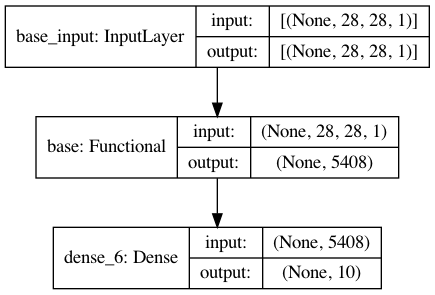

In [84]:
plot_model(digit_model, show_shapes=True, show_layer_names=True, to_file='digit_model.png')

### 모델 컴파일 및 훈련

In [85]:
# 모델 컴파일
digit_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# 모델 훈련
history = digit_model.fit(x_train_in, y_train, 
                    validation_data=(x_valid_in, y_valid), 
                    epochs=10)

Epoch 1/10
1875/1875 [==============================] - 10s 5ms/step - loss: 0.7026 - accuracy: 0.8370 - val_loss: 0.3847 - val_accuracy: 0.8937
Epoch 2/10
1875/1875 [==============================] - 9s 5ms/step - loss: 0.3595 - accuracy: 0.8971 - val_loss: 0.3174 - val_accuracy: 0.9095
Epoch 3/10
1875/1875 [==============================] - 9s 5ms/step - loss: 0.3200 - accuracy: 0.9067 - val_loss: 0.2967 - val_accuracy: 0.9145
Epoch 4/10
1875/1875 [==============================] - 9s 5ms/step - loss: 0.3032 - accuracy: 0.9114 - val_loss: 0.2899 - val_accuracy: 0.9149
Epoch 5/10
1875/1875 [==============================] - 9s 5ms/step - loss: 0.2939 - accuracy: 0.9139 - val_loss: 0.2777 - val_accuracy: 0.9196
Epoch 6/10
1875/1875 [==============================] - 9s 5ms/step - loss: 0.2868 - accuracy: 0.9164 - val_loss: 0.2699 - val_accuracy: 0.9215
Epoch 7/10
1875/1875 [==============================] - 9s 5ms/step - loss: 0.2815 - accuracy: 0.9187 - val_loss: 0.2738 - val_accuracy

### 베이스 모델의 가중치를 고정 (Freeze Model)

In [86]:
base_model_frozen = tf.keras.models.Model(inputs=model.input, outputs=base_model_output, name='base_frozen')
base_model_frozen.trainable = False
base_model_frozen.summary()

Model: "base_frozen"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inputs (InputLayer)          [(None, 28, 28, 1)]       0         
_________________________________________________________________
conv2d_layer (Conv2D)        (None, 26, 26, 32)        320       
_________________________________________________________________
maxpool_layer (MaxPooling2D) (None, 13, 13, 32)        0         
_________________________________________________________________
flatten_layer (Flatten)      (None, 5408)              0         
Total params: 320
Trainable params: 0
Non-trainable params: 320
_________________________________________________________________


### 함수형 API 적용

In [87]:
dense_output = tf.keras.layers.Dense(10, activation='softmax')(base_model_frozen.output)
digit_model_frozen = tf.keras.models.Model(inputs=base_model_frozen.input, outputs=dense_output)
digit_model_frozen.summary()

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inputs (InputLayer)          [(None, 28, 28, 1)]       0         
_________________________________________________________________
conv2d_layer (Conv2D)        (None, 26, 26, 32)        320       
_________________________________________________________________
maxpool_layer (MaxPooling2D) (None, 13, 13, 32)        0         
_________________________________________________________________
flatten_layer (Flatten)      (None, 5408)              0         
_________________________________________________________________
dense_7 (Dense)              (None, 10)                54090     
Total params: 54,410
Trainable params: 54,090
Non-trainable params: 320
_________________________________________________________________


### 모델 컴파일 및 훈련

In [88]:
# 모델 컴파일
digit_model_frozen.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# 모델 훈련
history = digit_model_frozen.fit(x_train_in, y_train, 
                    validation_data=(x_valid_in, y_valid), 
                    epochs=10)

Epoch 1/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.5878 - accuracy: 0.8570 - val_loss: 0.3568 - val_accuracy: 0.9020
Epoch 2/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.3438 - accuracy: 0.9017 - val_loss: 0.3096 - val_accuracy: 0.9128
Epoch 3/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.3134 - accuracy: 0.9091 - val_loss: 0.2911 - val_accuracy: 0.9150
Epoch 4/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.2989 - accuracy: 0.9130 - val_loss: 0.2854 - val_accuracy: 0.9173
Epoch 5/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.2907 - accuracy: 0.9153 - val_loss: 0.2758 - val_accuracy: 0.9212
Epoch 6/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.2840 - accuracy: 0.9176 - val_loss: 0.2679 - val_accuracy: 0.9226
Epoch 7/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.2791 - accuracy: 0.9190 - val_loss: 0.2720 - val_accuracy:

### 베이스 모델의 Conv2D 레이어의 가중치만 고정 (Freeze Layer)

In [89]:
base_model_frozen2 = tf.keras.models.Model(inputs=model.input, outputs=base_model_output, name='base_frozen2')
base_model_frozen2.get_layer('conv2d_layer').trainable = False
base_model_frozen2.summary()

Model: "base_frozen2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inputs (InputLayer)          [(None, 28, 28, 1)]       0         
_________________________________________________________________
conv2d_layer (Conv2D)        (None, 26, 26, 32)        320       
_________________________________________________________________
maxpool_layer (MaxPooling2D) (None, 13, 13, 32)        0         
_________________________________________________________________
flatten_layer (Flatten)      (None, 5408)              0         
Total params: 320
Trainable params: 0
Non-trainable params: 320
_________________________________________________________________


### 함수형 API 적용

In [90]:
dense_output2 = tf.keras.layers.Dense(10, activation='softmax')(base_model_frozen2.output)
digit_model_frozen2 = tf.keras.models.Model(inputs=base_model_frozen2.input, outputs=dense_output2)
digit_model_frozen2.summary()

Model: "model_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inputs (InputLayer)          [(None, 28, 28, 1)]       0         
_________________________________________________________________
conv2d_layer (Conv2D)        (None, 26, 26, 32)        320       
_________________________________________________________________
maxpool_layer (MaxPooling2D) (None, 13, 13, 32)        0         
_________________________________________________________________
flatten_layer (Flatten)      (None, 5408)              0         
_________________________________________________________________
dense_8 (Dense)              (None, 10)                54090     
Total params: 54,410
Trainable params: 54,090
Non-trainable params: 320
_________________________________________________________________


### 모델 컴파일 및 훈련

In [91]:
# 모델 컴파일
digit_model_frozen2.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# 모델 훈련
history = digit_model_frozen2.fit(x_train_in, y_train, 
                    validation_data=(x_valid_in, y_valid), 
                    epochs=10)

Epoch 1/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.5872 - accuracy: 0.8573 - val_loss: 0.3568 - val_accuracy: 0.9019
Epoch 2/10
1875/1875 [==============================] - 3s 2ms/step - loss: 0.3438 - accuracy: 0.9019 - val_loss: 0.3096 - val_accuracy: 0.9123
Epoch 3/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.3134 - accuracy: 0.9091 - val_loss: 0.2912 - val_accuracy: 0.9150
Epoch 4/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.2989 - accuracy: 0.9130 - val_loss: 0.2855 - val_accuracy: 0.9172
Epoch 5/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.2907 - accuracy: 0.9152 - val_loss: 0.2759 - val_accuracy: 0.9208
Epoch 6/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.2840 - accuracy: 0.9177 - val_loss: 0.2680 - val_accuracy: 0.9229
Epoch 7/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.2791 - accuracy: 0.9190 - val_loss: 0.2721 - val_accuracy:

## LeNet-5

### 데이터 가져오기

In [92]:
num_classes = 10
img_rows, img_cols, img_ch = 28, 28, 1
input_shape = (img_rows, img_cols, img_ch)

(x_train, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()
x_train, x_test = x_train / 255.0, x_test / 255.0

x_train = x_train.reshape(x_train.shape[0], *input_shape)
x_test = x_test.reshape(x_test.shape[0], *input_shape)

### 모델 클래스

In [93]:
from tensorflow.keras import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

class LeNet5(Model):
    
    def __init__(self, num_classes):
        """
        Initialize the model.
        :param num_classes:     Number of classes to predict from
        """
        super(LeNet5, self).__init__()
        # We instantiate the various layers composing LeNet-5:
        # self.conv1 = SimpleConvolutionLayer(6, kernel_size=(5, 5))
        # self.conv2 = SimpleConvolutionLayer(16, kernel_size=(5, 5))
        # ... or using the existing and (recommended) Conv2D class:
        self.conv1 = Conv2D(6, kernel_size=(5, 5), padding='same', activation='relu')
        self.conv2 = Conv2D(16, kernel_size=(5, 5), activation='relu')
        self.max_pool = MaxPooling2D(pool_size=(2, 2))
        self.flatten = Flatten()
        self.dense1 = Dense(120, activation='relu')
        self.dense2 = Dense(84, activation='relu')
        self.dense3 = Dense(num_classes, activation='softmax')
        
    def call(self, inputs):
        """
        Call the layers and perform their operations on the input tensors
        :param inputs:  Input tensor
        :return:        Output tensor
        """
        x = self.max_pool(self.conv1(inputs))        # 1st block
        x = self.max_pool(self.conv2(x))             # 2nd block
        x = self.flatten(x)
        x = self.dense3(self.dense2(self.dense1(x))) # dense layers
        return x

### 모델 컴파일 과 훈련

In [94]:
model = LeNet5(num_classes)
model.compile(optimizer='sgd', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [95]:
# We can call `model.summary()` only if the model was built before. 
# It is normally done automatically at the first use of the network,
# inferring the input shapes from the samples the network is given.
# For instance, the command below would build the network (then use it for prediction):
_ = model.predict(x_test[:10])

# But we can build the model manually otherwise, providing the batched
# input shape ourselves:
batched_input_shape = tf.TensorShape((None, *input_shape))
model.build(input_shape=batched_input_shape)

# Method to visualize the architecture of the network:
model.summary()

Model: "le_net5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_7 (Conv2D)            multiple                  156       
_________________________________________________________________
conv2d_8 (Conv2D)            multiple                  2416      
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 multiple                  0         
_________________________________________________________________
flatten_6 (Flatten)          multiple                  0         
_________________________________________________________________
dense_9 (Dense)              multiple                  48120     
_________________________________________________________________
dense_10 (Dense)             multiple                  10164     
_________________________________________________________________
dense_11 (Dense)             multiple                  850 

In [96]:
callbacks = [
    # Callback to interrupt the training if the validation loss (`val_loss`) stops improving for over 3 epochs:
    tf.keras.callbacks.EarlyStopping(patience=5, monitor='val_loss'),
    # Callback to log the graph, losses and metrics into TensorBoard (saving log files in `./logs` directory):
    tf.keras.callbacks.TensorBoard(log_dir='./logs', histogram_freq=1, write_graph=True)]

In [97]:
history = model.fit(x_train, y_train,
                    batch_size=32, epochs=80, validation_data=(x_test, y_test), 
                    verbose=2,  # change to `verbose=1` to get a progress bar
                                # (we opt for `verbose=2` here to reduce the log size)
                    callbacks=callbacks)

Epoch 1/80
1875/1875 - 16s - loss: 0.5600 - accuracy: 0.8232 - val_loss: 0.1460 - val_accuracy: 0.9534
Epoch 2/80
1875/1875 - 17s - loss: 0.1282 - accuracy: 0.9607 - val_loss: 0.0929 - val_accuracy: 0.9707
Epoch 3/80
1875/1875 - 17s - loss: 0.0922 - accuracy: 0.9711 - val_loss: 0.0678 - val_accuracy: 0.9773
Epoch 4/80
1875/1875 - 17s - loss: 0.0750 - accuracy: 0.9773 - val_loss: 0.0695 - val_accuracy: 0.9757
Epoch 5/80
1875/1875 - 16s - loss: 0.0641 - accuracy: 0.9809 - val_loss: 0.0601 - val_accuracy: 0.9799
Epoch 6/80
1875/1875 - 17s - loss: 0.0561 - accuracy: 0.9834 - val_loss: 0.0484 - val_accuracy: 0.9833
Epoch 7/80
1875/1875 - 17s - loss: 0.0500 - accuracy: 0.9840 - val_loss: 0.0483 - val_accuracy: 0.9842
Epoch 8/80
1875/1875 - 16s - loss: 0.0451 - accuracy: 0.9857 - val_loss: 0.0518 - val_accuracy: 0.9841
Epoch 9/80
1875/1875 - 16s - loss: 0.0417 - accuracy: 0.9871 - val_loss: 0.0423 - val_accuracy: 0.9861
Epoch 10/80
1875/1875 - 16s - loss: 0.0369 - accuracy: 0.9888 - val_loss:

## ResNet 모델 사용

### ResNet-5 모델 호출

In [98]:
model = keras.applications.resnet50.ResNet50(weights="imagenet")

### 이미지 가져오기

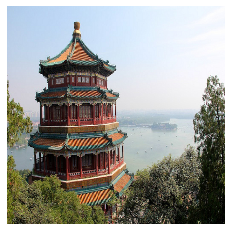

In [99]:
images_resized = tf.image.resize(images, [224, 224])
plot_color_image(images_resized[0])
plt.show()

### 이미지의 크기 변환

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


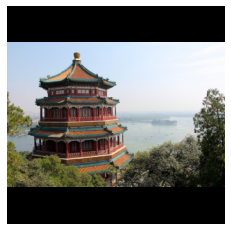

In [100]:
images_resized = tf.image.resize_with_pad(images, 224, 224, antialias=True)
plot_color_image(images_resized[0])

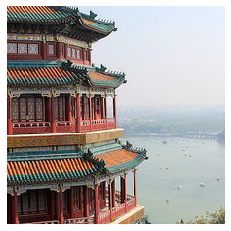

In [101]:
images_resized = tf.image.resize_with_crop_or_pad(images, 224, 224)
plot_color_image(images_resized[0])
plt.show()

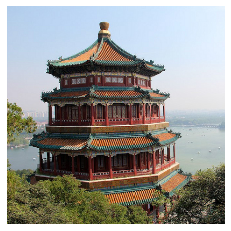

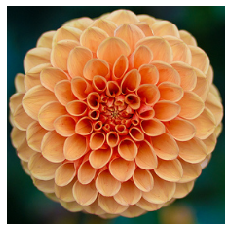

In [102]:
china_box = [0, 0.03, 1, 0.68]
flower_box = [0.19, 0.26, 0.86, 0.7]
images_resized = tf.image.crop_and_resize(images, [china_box, flower_box], [0, 1], [224, 224])
plot_color_image(images_resized[0])
plt.show()
plot_color_image(images_resized[1])
plt.show()

### 이미지 전처리를 수행하고 예측

In [103]:
inputs = keras.applications.resnet50.preprocess_input(images_resized * 255)
Y_proba = model.predict(inputs)

In [104]:
Y_proba.shape

(2, 1000)

In [105]:
top_K = keras.applications.resnet50.decode_predictions(Y_proba, top=3)
for image_index in range(len(images)):
    print("Image #{}".format(image_index))
    for class_id, name, y_proba in top_K[image_index]:
        print("  {} - {:12s} {:.2f}%".format(class_id, name, y_proba * 100))
    print()

Image #0
  n03877845 - palace       43.39%
  n02825657 - bell_cote    43.07%
  n03781244 - monastery    11.70%

Image #1
  n04522168 - vase         53.96%
  n07930864 - cup          9.52%
  n11939491 - daisy        4.97%



## 위성 이미지 분류

In [106]:
import tensorflow as tf
import numpy as np
import json
import matplotlib.pylab as plt

# Tensorflow Datasets 활용
import tensorflow_datasets as tfds

### 데이터 로드

In [107]:
#EuroSAT  위성 사진 데이터셋 로드

DATA_DIR = "dataset/"   

(train_ds, valid_ds), info = tfds.load('eurosat/rgb', split=['train[:80%]', 'train[80%:]'],
                                        shuffle_files=True, 
                                        as_supervised=True,
                                        with_info=True,
                                        data_dir=DATA_DIR)
print(train_ds)
print(valid_ds)

<_OptionsDataset shapes: ((64, 64, 3), ()), types: (tf.uint8, tf.int64)>
<_OptionsDataset shapes: ((64, 64, 3), ()), types: (tf.uint8, tf.int64)>


### 메타데이터 확인

In [108]:
print(info)

tfds.core.DatasetInfo(
    name='eurosat',
    full_name='eurosat/rgb/2.0.0',
    description="""
    EuroSAT dataset is based on Sentinel-2 satellite images covering 13 spectral
    bands and consisting of 10 classes with 27000 labeled and
    geo-referenced samples.
    
    Two datasets are offered:
    - rgb: Contains only the optical R, G, B frequency bands encoded as JPEG image.
    - all: Contains all 13 bands in the original value range (float32).
    
    URL: https://github.com/phelber/eurosat
    """,
    config_description="""
    Sentinel-2 RGB channels
    """,
    homepage='https://github.com/phelber/eurosat',
    data_path='dataset/eurosat/rgb/2.0.0',
    download_size=89.91 MiB,
    dataset_size=89.50 MiB,
    features=FeaturesDict({
        'filename': Text(shape=(), dtype=tf.string),
        'image': Image(shape=(64, 64, 3), dtype=tf.uint8),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=10),
    }),
    supervised_keys=('image', 'label'),
    disa

### 샘플 데이터 확인

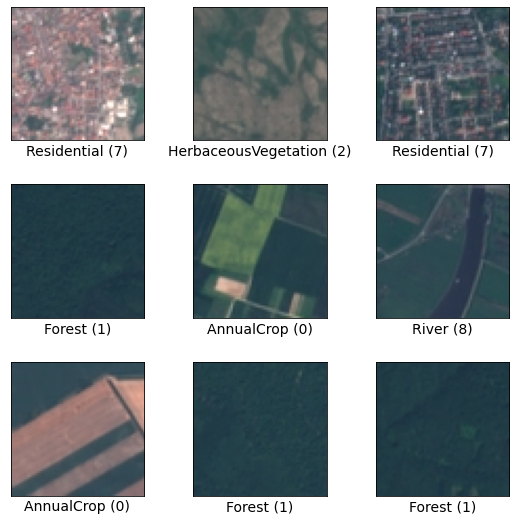

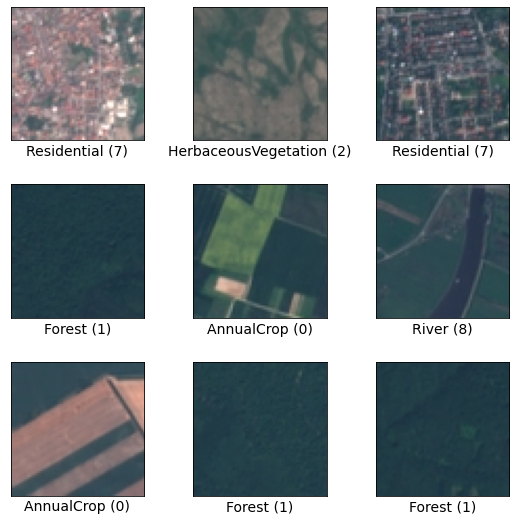

In [109]:
tfds.show_examples(train_ds, info)

### dataframe으로 변환해서 샘플 출력

,image,label
0,,1 (Forest)
1,,7 (Residential)
2,,0 (AnnualCrop)
3,,2 (HerbaceousVegetation)
4,,9 (SeaLake)

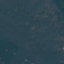
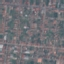
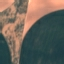
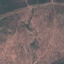
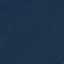

In [110]:
tfds.as_dataframe(valid_ds.take(5), info)

### 타겟 클래스의 개수

In [111]:
NUM_CLASSES = info.features["label"].num_classes
print(NUM_CLASSES)

10


### 숫자 레이블을 활용하여 문자열 메타데이터로 변환

In [112]:
for i in range(10):
    print(info.features["label"].int2str(i))

AnnualCrop
Forest
HerbaceousVegetation
Highway
Industrial
Pasture
PermanentCrop
Residential
River
SeaLake


### 데이터 전처리 파이프라인 

In [113]:
BATCH_SIZE = 64
BUFFER_SIZE = 1000

def preprocess_data(image, label):
    image = tf.cast(image, tf.float32) / 255.   # 0~1 정규화, float32 변환
    return image, label

train_data = train_ds.map(preprocess_data, num_parallel_calls=tf.data.AUTOTUNE)
valid_data = valid_ds.map(preprocess_data, num_parallel_calls=tf.data.AUTOTUNE)

train_data = train_data.shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
valid_data = valid_data.batch(BATCH_SIZE).cache().prefetch(tf.data.AUTOTUNE) 

### 모델 생성

In [114]:
# Sequential API를 사용하여 샘플 모델 생성

def build_model():

    model = tf.keras.Sequential([

        # Convolution 층 
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),

        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),

        # Classifier 출력층 
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation='relu'), 
        tf.keras.layers.Dropout(0.3),  
        tf.keras.layers.Dense(64, activation='relu'), 
        tf.keras.layers.Dropout(0.3),              
        tf.keras.layers.Dense(NUM_CLASSES, activation='softmax'),
    ])

    return model

model = build_model()

### 모델 컴파일 및 훈련

In [115]:
# 모델 컴파일
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# 모델 훈련
history = model.fit(train_data, 
                    validation_data=valid_data, 
                    epochs=50)                   

Epoch 1/50
338/338 [==============================] - 58s 169ms/step - loss: 1.7125 - accuracy: 0.3978 - val_loss: 1.6355 - val_accuracy: 0.4578
Epoch 2/50
338/338 [==============================] - 59s 174ms/step - loss: 1.3118 - accuracy: 0.5276 - val_loss: 1.0131 - val_accuracy: 0.6504
Epoch 3/50
338/338 [==============================] - 56s 166ms/step - loss: 1.1092 - accuracy: 0.6050 - val_loss: 0.8775 - val_accuracy: 0.7181
Epoch 4/50
338/338 [==============================] - 56s 165ms/step - loss: 1.0064 - accuracy: 0.6388 - val_loss: 0.7204 - val_accuracy: 0.7633
Epoch 5/50
338/338 [==============================] - 57s 170ms/step - loss: 0.9151 - accuracy: 0.6722 - val_loss: 0.5959 - val_accuracy: 0.8093
Epoch 6/50
338/338 [==============================] - 60s 177ms/step - loss: 0.8207 - accuracy: 0.7106 - val_loss: 0.6042 - val_accuracy: 0.8052
Epoch 7/50
338/338 [==============================] - 57s 170ms/step - loss: 0.7584 - accuracy: 0.7337 - val_loss: 0.5457 - val_ac

### 손실함수, 정확도 그래프 그리기 

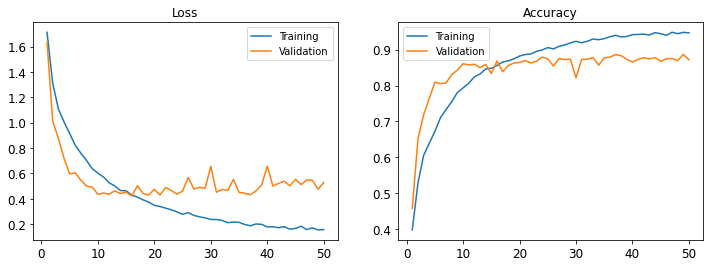

In [116]:
def plot_loss_acc(history, epoch):

    loss, val_loss = history.history['loss'], history.history['val_loss']
    acc, val_acc = history.history['accuracy'], history.history['val_accuracy']

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    axes[0].plot(range(1, epoch + 1), loss, label='Training')
    axes[0].plot(range(1, epoch + 1), val_loss, label='Validation')
    axes[0].legend(loc='best')
    axes[0].set_title('Loss')

    axes[1].plot(range(1, epoch + 1), acc, label='Training')
    axes[1].plot(range(1, epoch + 1), val_acc, label='Validation')
    axes[1].legend(loc='best')
    axes[1].set_title('Accuracy')

    plt.show()

plot_loss_acc(history, 50)

### 데이터 증강

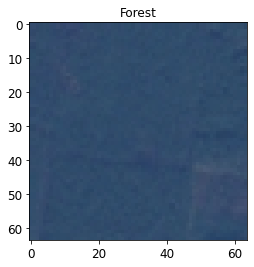

In [117]:
# 샘플 이미지 출력
image_batch, label_batch = next(iter(train_data.take(1)))

image = image_batch[0]
label = label_batch[0].numpy()

plt.imshow(image)
plt.title(info.features["label"].int2str(label));

In [118]:
# 데이터 증강 전후를 비교하는 시각화 함수를 정의
def plot_augmentation(original, augmented):

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    axes[0].imshow(original)
    axes[0].set_title('Original')

    axes[1].imshow(augmented)
    axes[1].set_title('Augmented')

    plt.show()

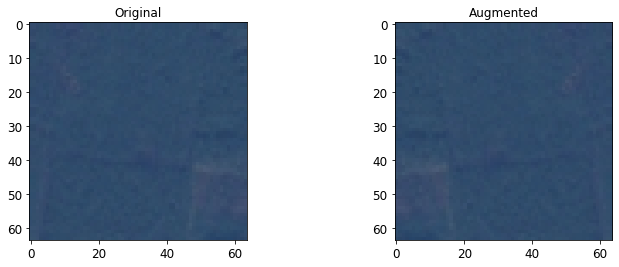

In [119]:
# 좌우 뒤집기 
lr_flip = tf.image.flip_left_right(image)
plot_augmentation(image, lr_flip)

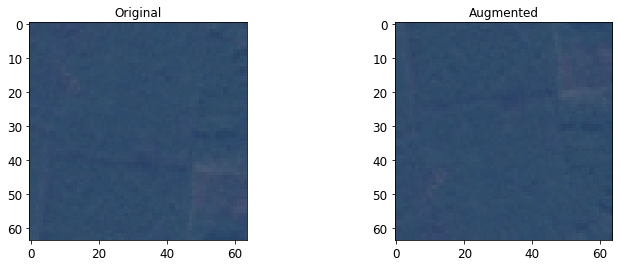

In [120]:
# 상하 뒤집기 
ud_flip = tf.image.flip_up_down(image)
plot_augmentation(image, ud_flip)

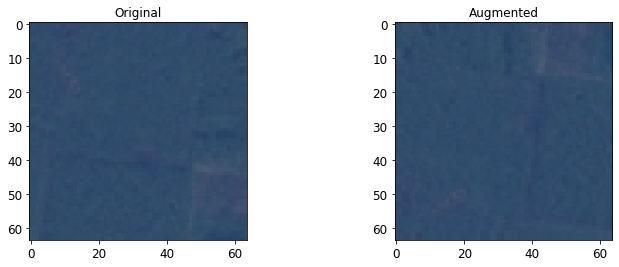

In [121]:
# 회전 
rotate90 = tf.image.rot90(image)
plot_augmentation(image, rotate90)

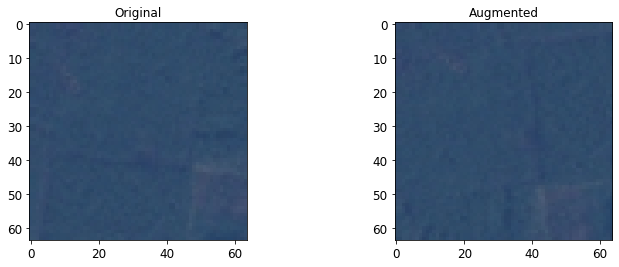

In [122]:
# transpose 
transpose = tf.image.transpose(image)
plot_augmentation(image, transpose)

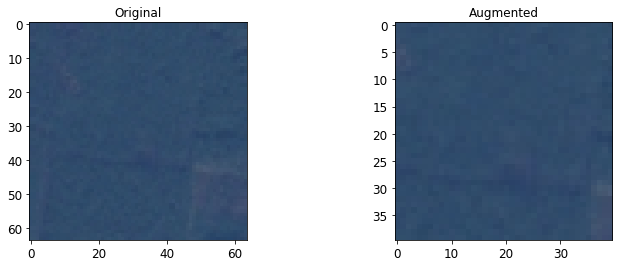

In [123]:
# 이미지 자르기 1
crop1 = tf.image.central_crop(image, central_fraction=0.6)
plot_augmentation(image, crop1)

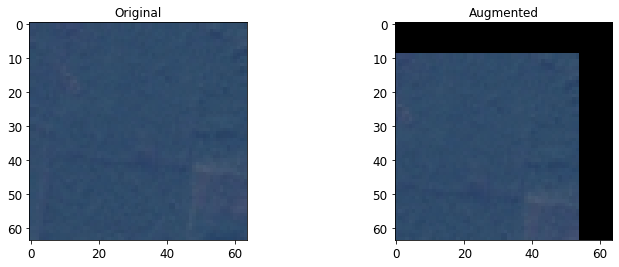

In [124]:
# 이미지 자르기 2 
img = tf.image.resize_with_crop_or_pad(image, 64 + 20, 64 + 20) # 사이즈 키우기
crop2 = tf.image.random_crop(img, size=[64, 64, 3])
plot_augmentation(image, crop2)

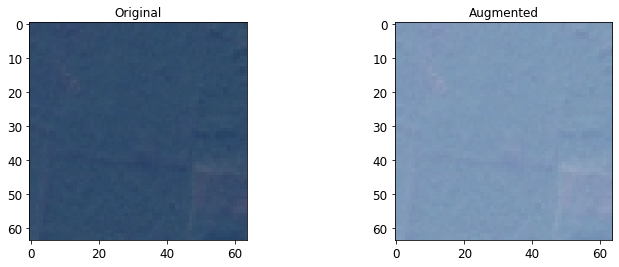

In [125]:
# 이미지 밝기 
brightness = tf.image.adjust_brightness(image, delta=0.3)
plot_augmentation(image, brightness)

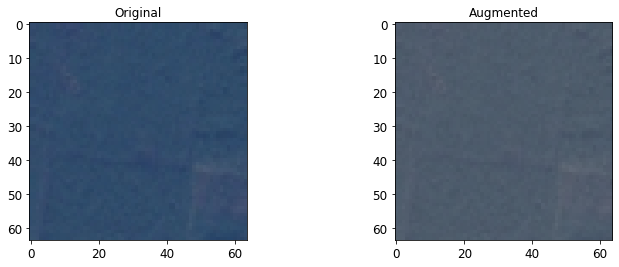

In [126]:
# 이미지 채도 
saturation = tf.image.adjust_saturation(image, saturation_factor=0.5)
plot_augmentation(image, saturation)

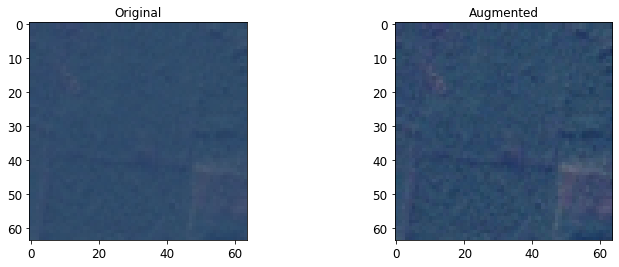

In [127]:
# 이미지 대비  
contrast = tf.image.adjust_contrast(image, contrast_factor=2)
plot_augmentation(image, contrast)

### 이미지 증강 전처리

In [128]:
def data_augmentation(image, label):

    image = tf.image.random_flip_left_right(image) # 좌우 반전
    image = tf.image.random_flip_up_down(image) # 상하 반전    
    image = tf.image.random_brightness(image, max_delta=0.3) # 밝기 변화 
    image = tf.image.random_crop(image, size=[64, 64, 3])

    image = tf.cast(image, tf.float32) / 255.   # 0~1 정규화

    return image, label

train_aug = train_ds.map(data_augmentation, num_parallel_calls=tf.data.AUTOTUNE)
valid_aug = valid_ds.map(data_augmentation, num_parallel_calls=tf.data.AUTOTUNE)

train_aug = train_aug.shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
valid_aug = valid_aug.batch(BATCH_SIZE).cache().prefetch(tf.data.AUTOTUNE) 

print(train_aug)
print(valid_aug)

<PrefetchDataset shapes: ((None, 64, 64, 3), (None,)), types: (tf.float32, tf.int64)>
<PrefetchDataset shapes: ((None, 64, 64, 3), (None,)), types: (tf.float32, tf.int64)>


### 이미지 증강 후 모델 생성 과 훈련

In [129]:
# 모델 생성
aug_model = build_model()

# 모델 컴파일
aug_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

checkpoint_cb = keras.callbacks.ModelCheckpoint('best-cnn-model.h5')
early_stopping_cb = keras.callbacks.EarlyStopping(patience=2,
                                                  restore_best_weights=True)

# 모델 훈련
aug_history = aug_model.fit(train_aug, 
                            validation_data=valid_aug, 
                            epochs=50,
                            callbacks=[checkpoint_cb, early_stopping_cb])      

Epoch 1/50
338/338 [==============================] - 56s 163ms/step - loss: 1.9115 - accuracy: 0.2868 - val_loss: 1.9141 - val_accuracy: 0.2806
Epoch 2/50
338/338 [==============================] - 57s 169ms/step - loss: 1.6320 - accuracy: 0.3670 - val_loss: 1.3471 - val_accuracy: 0.5004
Epoch 3/50
338/338 [==============================] - 57s 169ms/step - loss: 1.4710 - accuracy: 0.4299 - val_loss: 1.2513 - val_accuracy: 0.5504
Epoch 4/50
338/338 [==============================] - 57s 168ms/step - loss: 1.3881 - accuracy: 0.4600 - val_loss: 1.1583 - val_accuracy: 0.5744
Epoch 5/50
338/338 [==============================] - 57s 169ms/step - loss: 1.3297 - accuracy: 0.4906 - val_loss: 1.1731 - val_accuracy: 0.5815
Epoch 6/50
338/338 [==============================] - 57s 168ms/step - loss: 1.2963 - accuracy: 0.5051 - val_loss: 1.0594 - val_accuracy: 0.6333
Epoch 7/50
338/338 [==============================] - 57s 168ms/step - loss: 1.2409 - accuracy: 0.5326 - val_loss: 1.0593 - val_ac

### 손실함수, 정확도 그래프 그리기 

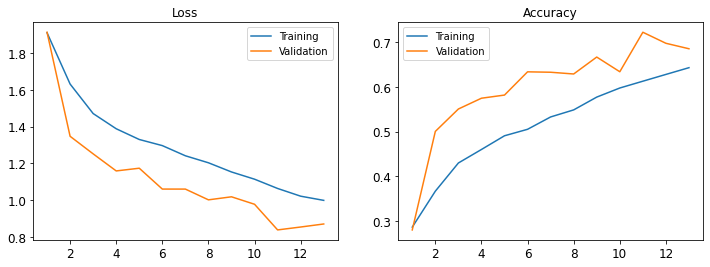

In [130]:
plot_loss_acc(aug_history, 13)

## 사전 학습된 모델을 이용한 훈련

### Pre-trained 모델을 사전 학습된 가중치와 함께 가져오기

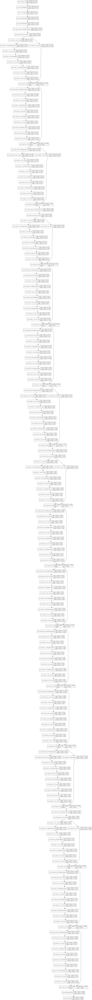

In [131]:
from tensorflow.keras.applications import ResNet50V2

pre_trained_base = ResNet50V2(include_top=False, 
                               weights='imagenet',
                               input_shape=[64, 64, 3])
, 
# 사전 학습된 가중치를 업데이트 되지 않도록 설정
pre_trained_base.trainable = False

# 모델 구조 시각화
from tensorflow.python.keras.utils.vis_utils import plot_model
plot_model(pre_trained_base, show_shapes=True, show_layer_names=True, to_file='resnet50.png')

### 모델 생성

In [132]:
# Top 층에 Classifier 추가
def build_trainsfer_classifier():

    model = tf.keras.Sequential([

        # Pre-trained Base 
        pre_trained_base,
        # Classifier 출력층 
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation='relu'), 
        tf.keras.layers.Dropout(0.3),  
        tf.keras.layers.Dense(64, activation='relu'), 
        tf.keras.layers.Dropout(0.3),              
        tf.keras.layers.Dense(NUM_CLASSES, activation='softmax'),
    ])

    return model

# 모델 구조
tc_model = build_trainsfer_classifier()    
tc_model.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50v2 (Functional)      (None, 2, 2, 2048)        23564800  
_________________________________________________________________
flatten_9 (Flatten)          (None, 8192)              0         
_________________________________________________________________
dense_18 (Dense)             (None, 128)               1048704   
_________________________________________________________________
dropout_6 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_19 (Dense)             (None, 64)                8256      
_________________________________________________________________
dropout_7 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_20 (Dense)             (None, 10)               

### 모델 컴파일 및 훈련

In [133]:
# 모델 컴파일
tc_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

checkpoint_cb = keras.callbacks.ModelCheckpoint('best-cnn-model.h5')
early_stopping_cb = keras.callbacks.EarlyStopping(patience=2,
                                                  restore_best_weights=True)
# 모델 훈련
tc_history = tc_model.fit(train_aug, 
                          validation_data=valid_aug, 
                          epochs=50,
                          callbacks=[checkpoint_cb, early_stopping_cb])      

Epoch 1/50
338/338 [==============================] - 101s 292ms/step - loss: 1.0454 - accuracy: 0.6700 - val_loss: 0.6028 - val_accuracy: 0.8019
Epoch 2/50
338/338 [==============================] - 98s 291ms/step - loss: 0.7131 - accuracy: 0.7725 - val_loss: 0.5377 - val_accuracy: 0.8243
Epoch 3/50
338/338 [==============================] - 98s 290ms/step - loss: 0.6277 - accuracy: 0.8007 - val_loss: 0.5091 - val_accuracy: 0.8293
Epoch 4/50
338/338 [==============================] - 100s 295ms/step - loss: 0.5585 - accuracy: 0.8202 - val_loss: 0.4994 - val_accuracy: 0.8335
Epoch 5/50
338/338 [==============================] - 99s 293ms/step - loss: 0.5207 - accuracy: 0.8322 - val_loss: 0.4879 - val_accuracy: 0.8424
Epoch 6/50
338/338 [==============================] - 99s 292ms/step - loss: 0.4860 - accuracy: 0.8438 - val_loss: 0.4718 - val_accuracy: 0.8413
Epoch 7/50
338/338 [==============================] - 1870s 6s/step - loss: 0.4624 - accuracy: 0.8496 - val_loss: 0.4559 - val_a

### 손실함수, 정확도 그래프 그리기 

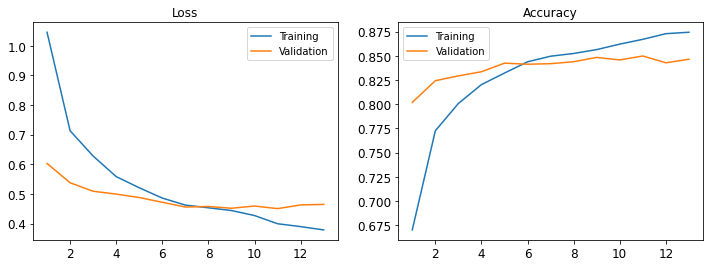

In [134]:
plot_loss_acc(tc_history, 13)

## 개/고양이 분류

### 공통 코드

In [135]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import numpy as np
import matplotlib.pylab as plt

### 훈련 셋, 검증 셋 저장위치 지정

In [136]:
train_dir = "./data/datasets/archive/training_set/training_set"
valid_dir = "./data/datasets/archive/test_set/test_set"
print(train_dir)
print(valid_dir)

./data/datasets/archive/training_set/training_set
./data/datasets/archive/test_set/test_set


### 이미지 데이터 제너레이터 정의 (Augmentation 미적용)

In [137]:
image_gen = ImageDataGenerator(rescale=(1/255.))
image_gen

### flow_from_directory 함수로 폴더에서 이미지 가져와서 제너레이터 객체로 정리 

In [138]:
train_gen = image_gen.flow_from_directory(train_dir, 
                                          batch_size=32, 
                                          target_size=(224, 224),   
                                          classes=['cats','dogs'], 
                                          class_mode = 'binary',
                                          seed=2020)

valid_gen = image_gen.flow_from_directory(valid_dir,                                          
                                          batch_size=32, 
                                          target_size=(224, 224),   
                                          classes=['cats','dogs'], 
                                          class_mode = 'binary',
                                          seed=2020)

Found 8005 images belonging to 2 classes.
Found 2023 images belonging to 2 classes.


### 샘플 이미지 출력

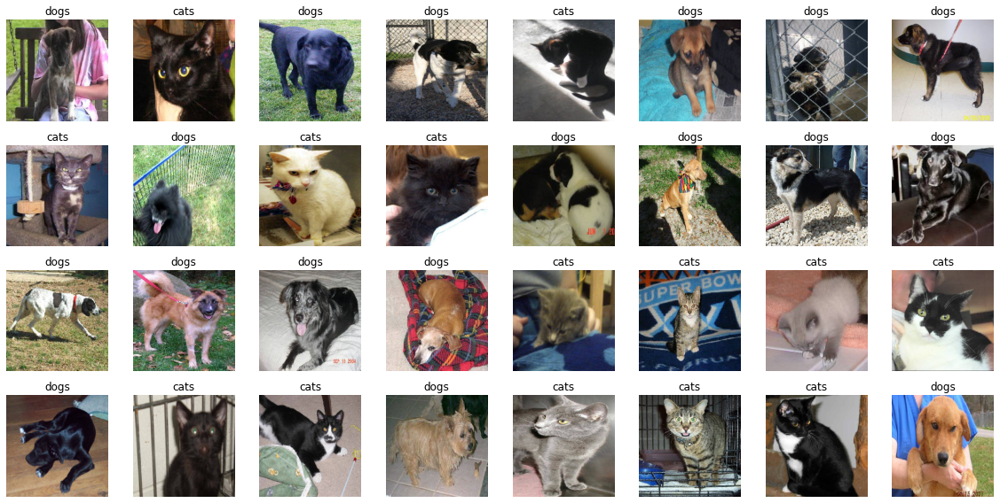

In [139]:
class_labels = ['cats', 'dogs']
batch = next(train_gen)
images, labels = batch[0], batch[1]

plt.figure(figsize=(16, 8))
for i in range(32):
    
    ax = plt.subplot(4, 8, i + 1)
    plt.imshow(images[i])
    plt.title(class_labels[labels[i].astype(np.int)])
    plt.axis("off")
plt.tight_layout()
plt.show()

### 모델 생성

In [140]:
# Sequential API를 사용하여 샘플 모델 생성

def build_model():

    model = tf.keras.Sequential([

        # Convolution 층 
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),

        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),

        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),

        # Classifier 출력층 
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(256, activation='relu'), 
        tf.keras.layers.Dropout(0.3),              
        tf.keras.layers.Dense(1, activation='sigmoid'),
    ])

    return model

model = build_model()

### 모델 컴파일 및 훈련

In [141]:
# 모델 컴파일
model.compile(optimizer=tf.optimizers.Adam(learning_rate=0.001), 
              loss='binary_crossentropy', 
              metrics=['accuracy'])

# 모델 훈련
history = model.fit(train_gen, validation_data=valid_gen, epochs=20)

Epoch 1/20
251/251 [==============================] - 341s 1s/step - loss: 2.1339 - accuracy: 0.6014 - val_loss: 0.6386 - val_accuracy: 0.6668
Epoch 2/20
251/251 [==============================] - 339s 1s/step - loss: 0.6063 - accuracy: 0.6627 - val_loss: 0.5939 - val_accuracy: 0.7019
Epoch 3/20
251/251 [==============================] - 328s 1s/step - loss: 0.5782 - accuracy: 0.6807 - val_loss: 0.5820 - val_accuracy: 0.6901
Epoch 4/20
251/251 [==============================] - 786s 3s/step - loss: 0.5688 - accuracy: 0.6938 - val_loss: 0.5510 - val_accuracy: 0.7098
Epoch 5/20
251/251 [==============================] - 329s 1s/step - loss: 0.5372 - accuracy: 0.7087 - val_loss: 0.5486 - val_accuracy: 0.7187
Epoch 6/20
251/251 [==============================] - 1531s 6s/step - loss: 0.5173 - accuracy: 0.7330 - val_loss: 0.5467 - val_accuracy: 0.7024
Epoch 7/20
251/251 [==============================] - 329s 1s/step - loss: 0.4976 - accuracy: 0.7575 - val_loss: 0.5125 - val_accuracy: 0.740

### 손실함수, 정확도 그래프 그리기 

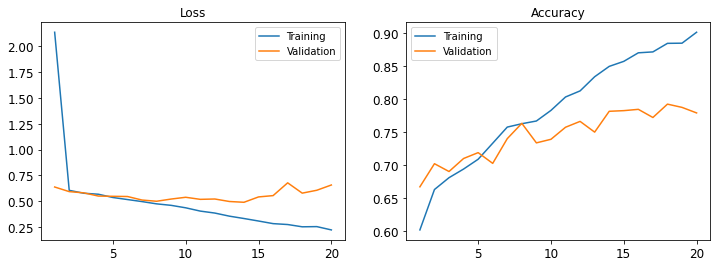

In [142]:
def plot_loss_acc(history, epoch):

    loss, val_loss = history.history['loss'], history.history['val_loss']
    acc, val_acc = history.history['accuracy'], history.history['val_accuracy']

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    axes[0].plot(range(1, epoch + 1), loss, label='Training')
    axes[0].plot(range(1, epoch + 1), val_loss, label='Validation')
    axes[0].legend(loc='best')
    axes[0].set_title('Loss')

    axes[1].plot(range(1, epoch + 1), acc, label='Training')
    axes[1].plot(range(1, epoch + 1), val_acc, label='Validation')
    axes[1].legend(loc='best')
    axes[1].set_title('Accuracy')

    plt.show()

plot_loss_acc(history, 20)

### Data Augmentation

In [ ]:
# 이미지 데이터 제너레이터 정의 (Augmentation 적용)
image_gen_aug = ImageDataGenerator(rescale=1/255., 
                                   horizontal_flip=True,
                                   rotation_range=35,                                
                                   zoom_range=0.2)

# flow_from_directory 함수로 폴더에서 이미지 가져와서 제너레이터 객체로 정리 
train_gen_aug = image_gen_aug.flow_from_directory(train_dir, 
                                                  batch_size=32, 
                                                  target_size=(224,224),   
                                                  classes=['cats','dogs'], 
                                                  class_mode = 'binary', 
                                                  seed=2020)

valid_gen_aug = image_gen_aug.flow_from_directory(valid_dir,  
                                                  batch_size=32, 
                                                  target_size=(224,224),   
                                                  classes=['cats','dogs'], 
                                                  class_mode = 'binary', 
                                                  seed=2020)

# 모델 생성
model_aug = build_model()

# 모델 컴파일
model_aug.compile(optimizer=tf.optimizers.Adam(learning_rate=0.001), 
              loss='binary_crossentropy', 
              metrics=['accuracy'])

# 모델 훈련
history_aug = model_aug.fit(train_gen_aug, validation_data=valid_gen_aug, epochs=40)

Found 8005 images belonging to 2 classes.
Found 2023 images belonging to 2 classes.
Epoch 1/40
251/251 [==============================] - 382s 2s/step - loss: 1.8924 - accuracy: 0.5909 - val_loss: 0.6325 - val_accuracy: 0.6599
Epoch 2/40
251/251 [==============================] - 850s 3s/step - loss: 0.6233 - accuracy: 0.6480 - val_loss: 0.5995 - val_accuracy: 0.6876
Epoch 3/40
251/251 [==============================] - 432s 2s/step - loss: 0.5982 - accuracy: 0.6736 - val_loss: 0.5786 - val_accuracy: 0.7064
Epoch 4/40
251/251 [==============================] - 467s 2s/step - loss: 0.5984 - accuracy: 0.6736 - val_loss: 0.5923 - val_accuracy: 0.6831
Epoch 5/40
251/251 [==============================] - 470s 2s/step - loss: 0.5931 - accuracy: 0.6740 - val_loss: 0.5772 - val_accuracy: 0.7054
Epoch 6/40
251/251 [==============================] - 513s 2s/step - loss: 0.5752 - accuracy: 0.6951 - val_loss: 0.5623 - val_accuracy: 0.7113
Epoch 7/40
251/251 [==============================] - 413s

### 손실함수, 정확도 그래프 그리기 

In [ ]:
plot_loss_acc(history_aug, 40)

## Xception 전이학습

### 데이터 가져오기

In [62]:
import tensorflow_datasets as tfds

dataset, info = tfds.load("tf_flowers", as_supervised=True, with_info=True)

### 데이터 확인

In [63]:
info.splits

{'train': <SplitInfo num_examples=3670, num_shards=2>}

In [64]:
info.splits["train"]

<SplitInfo num_examples=3670, num_shards=2>

In [65]:
class_names = info.features["label"].names
class_names

['dandelion', 'daisy', 'tulips', 'sunflowers', 'roses']

In [66]:
n_classes = info.features["label"].num_classes

In [67]:
dataset_size = info.splits["train"].num_examples
dataset_size

3670

### 데이터 셋 분리

In [68]:
test_set_raw, valid_set_raw, train_set_raw = tfds.load(
    "tf_flowers",
    split=["train[:10%]", "train[10%:25%]", "train[25%:]"],
    as_supervised=True)

### 이미지 확인

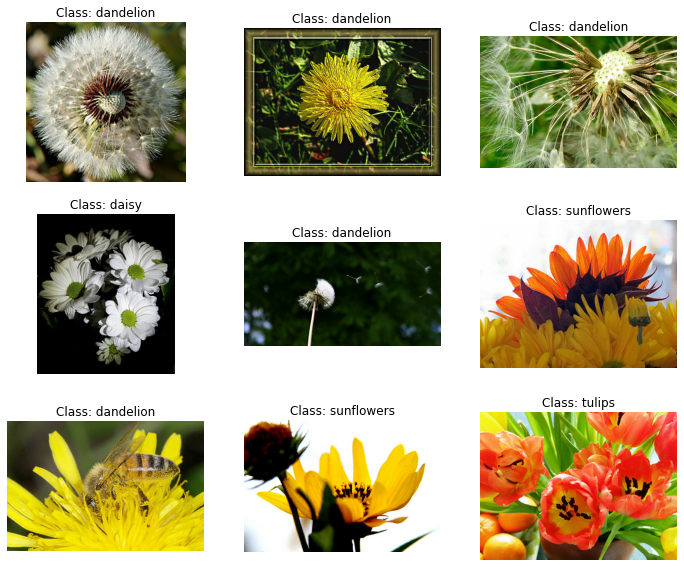

In [69]:
plt.figure(figsize=(12, 10))
index = 0
for image, label in train_set_raw.take(9):
    index += 1
    plt.subplot(3, 3, index)
    plt.imshow(image)
    plt.title("Class: {}".format(class_names[label]))
    plt.axis("off")

plt.show()

In [70]:
from functools import partial

#이미지 전처리 함수
def preprocess(image, label):
    resized_image = tf.image.resize(image, [224, 224])
    final_image = keras.applications.xception.preprocess_input(resized_image)
    return final_image, label


In [71]:
def central_crop(image):
    shape = tf.shape(image)
    min_dim = tf.reduce_min([shape[0], shape[1]])
    top_crop = (shape[0] - min_dim) // 4
    bottom_crop = shape[0] - top_crop
    left_crop = (shape[1] - min_dim) // 4
    right_crop = shape[1] - left_crop
    return image[top_crop:bottom_crop, left_crop:right_crop]

def random_crop(image):
    shape = tf.shape(image)
    min_dim = tf.reduce_min([shape[0], shape[1]]) * 90 // 100
    return tf.image.random_crop(image, [min_dim, min_dim, 3])



In [72]:
def preprocess(image, label, randomize=False):
    if randomize:
        cropped_image = random_crop(image)
        cropped_image = tf.image.random_flip_left_right(cropped_image)
    else:
        cropped_image = central_crop(image)
    resized_image = tf.image.resize(cropped_image, [224, 224])
    final_image = keras.applications.xception.preprocess_input(resized_image)
    return final_image, label

### 배치 크기 설정 및 프리페치 적용

In [73]:
batch_size = 32
train_set = train_set_raw.shuffle(1000).repeat()
train_set = train_set.map(partial(preprocess, randomize=True)).batch(batch_size).prefetch(1)
valid_set = valid_set_raw.map(preprocess).batch(batch_size).prefetch(1)
test_set = test_set_raw.map(preprocess).batch(batch_size).prefetch(1)

### 이미지 확인

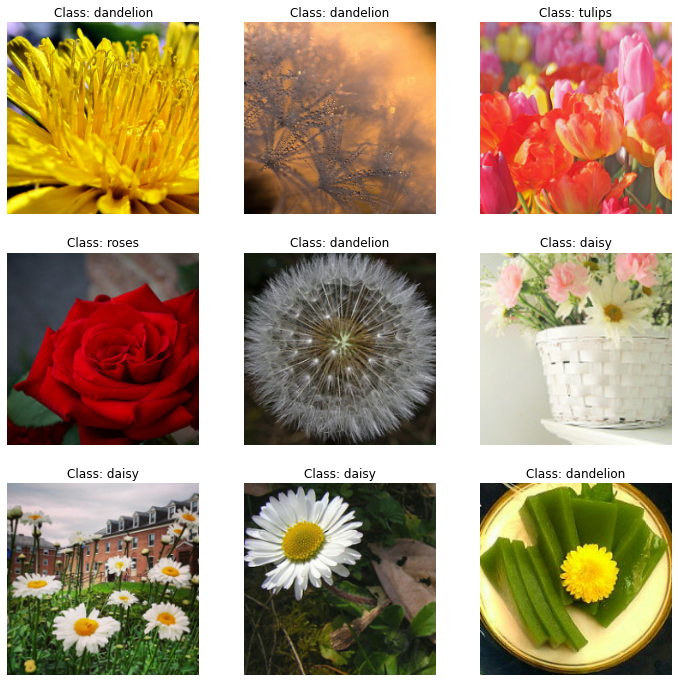

In [74]:
plt.figure(figsize=(12, 12))
for X_batch, y_batch in train_set.take(1):
    for index in range(9):
        plt.subplot(3, 3, index + 1)
        plt.imshow(X_batch[index] / 2 + 0.5)
        plt.title("Class: {}".format(class_names[y_batch[index]]))
        plt.axis("off")

plt.show()

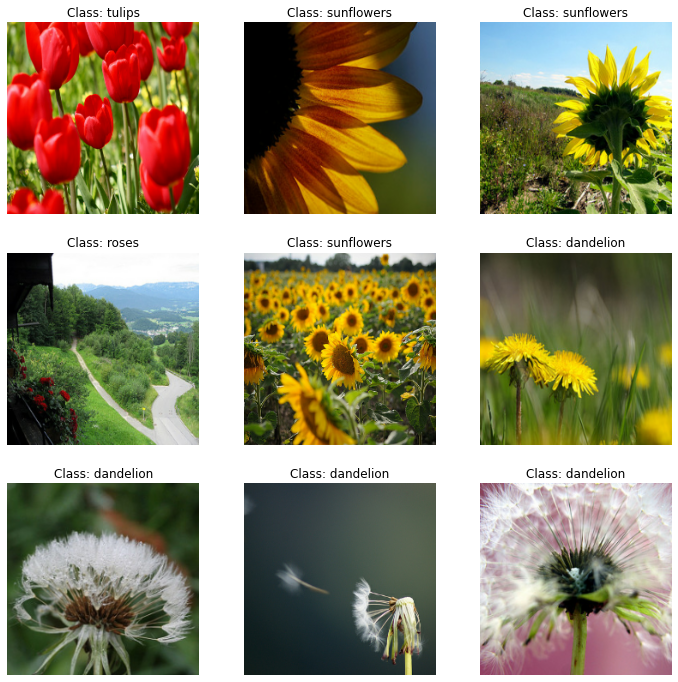

In [75]:
plt.figure(figsize=(12, 12))
for X_batch, y_batch in test_set.take(1):
    for index in range(9):
        plt.subplot(3, 3, index + 1)
        plt.imshow(X_batch[index] / 2 + 0.5)
        plt.title("Class: {}".format(class_names[y_batch[index]]))
        plt.axis("off")

plt.show()

In [76]:
base_model = keras.applications.xception.Xception(weights="imagenet",
                                                  include_top=False)
avg = keras.layers.GlobalAveragePooling2D()(base_model.output)
output = keras.layers.Dense(n_classes, activation="softmax")(avg)
model = keras.models.Model(inputs=base_model.input, outputs=output)

In [77]:
for index, layer in enumerate(base_model.layers):
    print(index, layer.name)

0 input_2
1 block1_conv1
2 block1_conv1_bn
3 block1_conv1_act
4 block1_conv2
5 block1_conv2_bn
6 block1_conv2_act
7 block2_sepconv1
8 block2_sepconv1_bn
9 block2_sepconv2_act
10 block2_sepconv2
11 block2_sepconv2_bn
12 conv2d_12
13 block2_pool
14 batch_normalization_12
15 add
16 block3_sepconv1_act
17 block3_sepconv1
18 block3_sepconv1_bn
19 block3_sepconv2_act
20 block3_sepconv2
21 block3_sepconv2_bn
22 conv2d_13
23 block3_pool
24 batch_normalization_13
25 add_1
26 block4_sepconv1_act
27 block4_sepconv1
28 block4_sepconv1_bn
29 block4_sepconv2_act
30 block4_sepconv2
31 block4_sepconv2_bn
32 conv2d_14
33 block4_pool
34 batch_normalization_14
35 add_2
36 block5_sepconv1_act
37 block5_sepconv1
38 block5_sepconv1_bn
39 block5_sepconv2_act
40 block5_sepconv2
41 block5_sepconv2_bn
42 block5_sepconv3_act
43 block5_sepconv3
44 block5_sepconv3_bn
45 add_3
46 block6_sepconv1_act
47 block6_sepconv1
48 block6_sepconv1_bn
49 block6_sepconv2_act
50 block6_sepconv2
51 block6_sepconv2_bn
52 block6_se

In [78]:
for layer in base_model.layers:
    layer.trainable = False

optimizer = keras.optimizers.SGD(lr=0.2, momentum=0.9, decay=0.01)
model.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer,
              metrics=["accuracy"])
history = model.fit(train_set,
                    steps_per_epoch=int(0.75 * dataset_size / batch_size),
                    validation_data=valid_set,
                    validation_steps=int(0.15 * dataset_size / batch_size),
                    epochs=5)

Epoch 1/5
86/86 [==============================] - 196s 2s/step - loss: 1.2644 - accuracy: 0.7969 - val_loss: 1.0204 - val_accuracy: 0.8658
Epoch 2/5
86/86 [==============================] - 175s 2s/step - loss: 0.5480 - accuracy: 0.8983 - val_loss: 0.8933 - val_accuracy: 0.8658
Epoch 3/5
86/86 [==============================] - 172s 2s/step - loss: 0.3044 - accuracy: 0.9281 - val_loss: 0.8468 - val_accuracy: 0.8585
Epoch 4/5
86/86 [==============================] - 183s 2s/step - loss: 0.2357 - accuracy: 0.9335 - val_loss: 0.7626 - val_accuracy: 0.8676
Epoch 5/5
86/86 [==============================] - 181s 2s/step - loss: 0.2010 - accuracy: 0.9451 - val_loss: 0.7142 - val_accuracy: 0.8603


In [ ]:
for layer in base_model.layers:
    layer.trainable = True

optimizer = keras.optimizers.SGD(learning_rate=0.01, momentum=0.9,
                                 nesterov=True, decay=0.001)
model.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer,
              metrics=["accuracy"])
history = model.fit(train_set,
                    steps_per_epoch=int(0.75 * dataset_size / batch_size),
                    validation_data=valid_set,
                    validation_steps=int(0.15 * dataset_size / batch_size),
                    epochs=40)

Epoch 1/40
86/86 [==============================] - 706s 8s/step - loss: 0.3098 - accuracy: 0.9015 - val_loss: 0.5388 - val_accuracy: 0.8732
Epoch 2/40
86/86 [==============================] - 781s 9s/step - loss: 0.0972 - accuracy: 0.9673 - val_loss: 0.3095 - val_accuracy: 0.8989
Epoch 3/40
86/86 [==============================] - 881s 10s/step - loss: 0.0697 - accuracy: 0.9782 - val_loss: 0.2689 - val_accuracy: 0.9136
Epoch 4/40
86/86 [==============================] - 844s 10s/step - loss: 0.0368 - accuracy: 0.9873 - val_loss: 0.2852 - val_accuracy: 0.9173
Epoch 5/40
29/86 [=========>....................] - ETA: 7:22 - loss: 0.0386 - accuracy: 0.9871

## 분류 와 위치 추정

### 모델 생성

In [ ]:
base_model = keras.applications.xception.Xception(weights="imagenet",
                                                  include_top=False)
avg = keras.layers.GlobalAveragePooling2D()(base_model.output)
class_output = keras.layers.Dense(n_classes, activation="softmax")(avg)
loc_output = keras.layers.Dense(4)(avg)
model = keras.models.Model(inputs=base_model.input,
                           outputs=[class_output, loc_output])
model.compile(loss=["sparse_categorical_crossentropy", "mse"],
              loss_weights=[0.8, 0.2], # depends on what you care most about
              optimizer=optimizer, metrics=["accuracy"])

### 모델 훈련

In [ ]:
def add_random_bounding_boxes(images, labels):
    fake_bboxes = tf.random.uniform([tf.shape(images)[0], 4])
    return images, (labels, fake_bboxes)

fake_train_set = train_set.take(5).repeat(2).map(add_random_bounding_boxes)

model.fit(fake_train_set, steps_per_epoch=5, epochs=2)

## Object Detection

### mAP

#### mAP 함수

In [ ]:
def maximum_precisions(precisions):
    return np.flip(np.maximum.accumulate(np.flip(precisions)))

#### 시각화

In [ ]:
recalls = np.linspace(0, 1, 11)

precisions = [0.91, 0.94, 0.96, 0.94, 0.95, 0.92, 0.80, 0.60, 0.45, 0.20, 0.10]
max_precisions = maximum_precisions(precisions)
mAP = max_precisions.mean()
plt.plot(recalls, precisions, "ro--", label="Precision")
plt.plot(recalls, max_precisions, "bo-", label="Max Precision")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.plot([0, 1], [mAP, mAP], "g:", linewidth=3, label="mAP")
plt.grid(True)
plt.axis([0, 1, 0, 1])
plt.legend(loc="lower center", fontsize=14)
plt.show()

### Faster R-CNN 알고리즘을 사용하는 inception_resnet_v2 사용

#### import

In [ ]:
import tensorflow as tf  # tensorflow 
import tensorflow_hub as tfhub  # tensorflow hub

#### 샘플 이미지 준비

344064/336122 [==============================] - 0s 1us/step


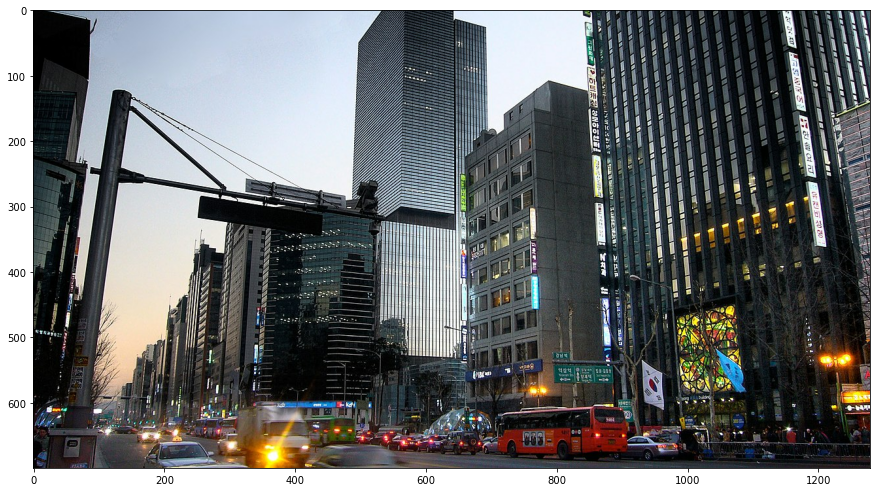

In [54]:
# 샘플 이미지 다운로드 
img_path = 'https://upload.wikimedia.org/wikipedia/commons/thumb/c/c4/Gangnam_Seoul_January_2009.jpg/1280px-Gangnam_Seoul_January_2009.jpg'
img = tf.keras.utils.get_file(fname='gangnam', origin=img_path)
img = tf.io.read_file(img)   # 파일 객체를 string으로 변환
img = tf.image.decode_jpeg(img, channels=3)   # 문자(string)를 숫자(unit8) 텐서로 변환
img = tf.image.convert_image_dtype(img, tf.float32)   # 0 ~ 1 범위로 정규화 

import matplotlib.pylab as plt
plt.figure(figsize=(15, 10))
plt.imshow(img)

#### 4차원 텐서로 변환

In [55]:
img_input = tf.expand_dims(img, 0)  # batch_size 추가
img_input.shape

TensorShape([1, 700, 1280, 3])

#### 학습 모델 가져오기

In [56]:
# TensorFlow Hub에서 모델 가져오기 - FasterRCNN+InceptionResNet V2 
model = tfhub.load("https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1")

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


#### 모델 시그니처(용도) 확인

In [57]:
model.signatures.keys()

KeysView(_SignatureMap({'default': <ConcreteFunction pruned(images) at 0x7FE098194880>}))

#### 객체탐지 모델 생성 

In [58]:
obj_detector = model.signatures['default']
obj_detector

<ConcreteFunction pruned(images) at 0x7FE098194880>

#### 모델 추론

In [59]:
result = obj_detector(img_input)  
result.keys()

dict_keys(['detection_class_names', 'detection_scores', 'detection_class_entities', 'detection_boxes', 'detection_class_labels'])

#### 탐지한 객체 개수 확인

In [60]:
len(result["detection_scores"])

100

#### 시각화

In [ ]:
# 객체 탐지 결과를 시각화
boxes = result["detection_boxes"]    # Bounding Box 좌표 예측값
labels = result["detection_class_entities"]   # 클래스 값 
scores = result["detection_scores"]   # 신뢰도 (confidence)

# 샘플 이미지 가로 세로 크기 
img_height, img_width = img.shape[0], img.shape[1]

# 탐지할 최대 객체의 수
obj_to_detect = 10

# 시각화 
plt.figure(figsize=(15, 10))
for i in range(min(obj_to_detect, boxes.shape[0])):    
    if scores[i] >= 0.2:
        (ymax, xmin, ymin, xmax) = (boxes[i][0]*img_height, boxes[i][1]*img_width,
                                    boxes[i][2]*img_height, boxes[i][3]*img_width)
                                    
        plt.imshow(img)
        plt.plot([xmin, xmax, xmax, xmin, xmin], [ymin, ymin, ymax, ymax, ymin],
                 color='yellow', linewidth=2)
        
        class_name = labels[i].numpy().decode('utf-8')
        infer_score = int(scores[i].numpy()*100)
        annotation = "{}: {}%".format(class_name, infer_score)
        plt.text(xmin+10, ymax+20, annotation,
                 color='white', backgroundcolor='blue', fontsize=10)

## Semantic Segmentation

### 필수 라이브러리 가져오기

In [11]:
import numpy as np
import tensorflow as tf
import matplotlib.pylab as plt
import cv2
from tqdm.notebook import tqdm
import tensorflow_datasets as tfds

#colab
#from google.colab.patches import cv2_imshow

### 변수 설정

In [12]:
# 이미지 크기
img_w = 128
img_h = 128
img_c = 3
img_shape = (img_w,img_h,img_c)

# 모델 학습
epoch_num = 5
learning_rate = 0.0001
buffer_size = 1000
batch_size = 16

In [13]:
# 텐서플로 데이터셋 로드 
ds_str='oxford_iiit_pet'
ds, info = tfds.load(name=ds_str, with_info=True)

In [14]:
# 이미지 전처리 함수 
def preprocess_image(ds):
    # 원본 이미지
    img = tf.image.resize(ds['image'], (img_w, img_h))
    img = tf.cast(img, tf.float32) / 255.0
    # 분할 마스크 
    mask = tf.image.resize(ds['segmentation_mask'], (img_w, img_h))
    mask = tf.cast(mask, tf.int32)
    mask = mask - 1
    return img, mask

In [15]:
# 데이터 전처리 파이프라인
train_ds = ds['train'].map(preprocess_image).shuffle(buffer_size).batch(batch_size).prefetch(2)
test_ds = ds['test'].map(preprocess_image).shuffle(buffer_size).batch(batch_size).prefetch(2)

print(train_ds)

<PrefetchDataset shapes: ((None, 128, 128, 3), (None, 128, 128, 1)), types: (tf.float32, tf.int32)>


In [16]:
# 샘플 배치 선택
img, mask = next(iter(train_ds))
len(img)

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment


16

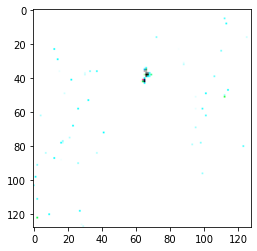

In [30]:
# 샘플 이미지 출력 
img = np.array(img[0])*255.0
img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
plt.imshow(img)

#cv2_imshow(img)

In [19]:
# 샘플 마스크 출력
mask = (np.array(mask[0])/2)*255.0
plt.imshow(mask)

#cv2_imshow(mask)

In [20]:
# VGG16 모델
base_model = tf.keras.applications.VGG16(input_shape=img_shape, include_top=False)

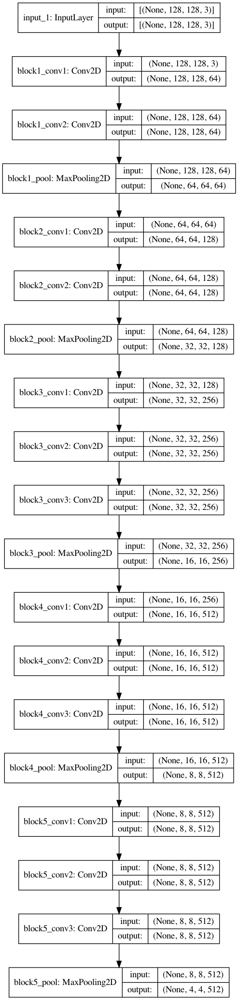

In [21]:
# 모델 구조
tf.keras.utils.plot_model(base_model,show_shapes=True)

In [22]:
# VGG16 중간 레이어 출력 텐서를 지정
f_model=tf.keras.Model(inputs=[base_model.input],
                       outputs=[
                                base_model.get_layer(name='block5_conv3').output,
                                base_model.get_layer(name='block4_conv3').output,
                                base_model.get_layer(name='block3_conv3').output,
                                base_model.get_layer(name='block2_conv2').output,
                                base_model.get_layer(name='block1_conv2').output
])

In [23]:
# 파라미터 고정
f_model.trainable = False

In [24]:
# U-Net 구조로 모델 정의

i=tf.keras.Input(shape=img_shape)

out_8_8_512, out_16_16_512, out_32_32_256, out_64_64_128, out_128_128_64 = f_model(i)

out = tf.keras.layers.Conv2DTranspose(512,3,strides=2,padding='same')(out_8_8_512)
out = tf.keras.layers.Add()([out,out_16_16_512])

out = tf.keras.layers.Conv2DTranspose(256,3,strides=2,padding='same')(out)
out = tf.keras.layers.Add()([out,out_32_32_256])

out = tf.keras.layers.Conv2DTranspose(128,3,strides=2,padding='same')(out)
out = tf.keras.layers.Add()([out,out_64_64_128])

out = tf.keras.layers.Conv2DTranspose(64,3,strides=2,padding='same')(out)
out = tf.keras.layers.Add()([out,out_128_128_64])

out = tf.keras.layers.Conv2D(3, 3, activation='elu', padding='same') (out)
out = tf.keras.layers.Dense(3,activation='softmax')(out)

unet_model = tf.keras.Model(inputs=[i], outputs=[out])

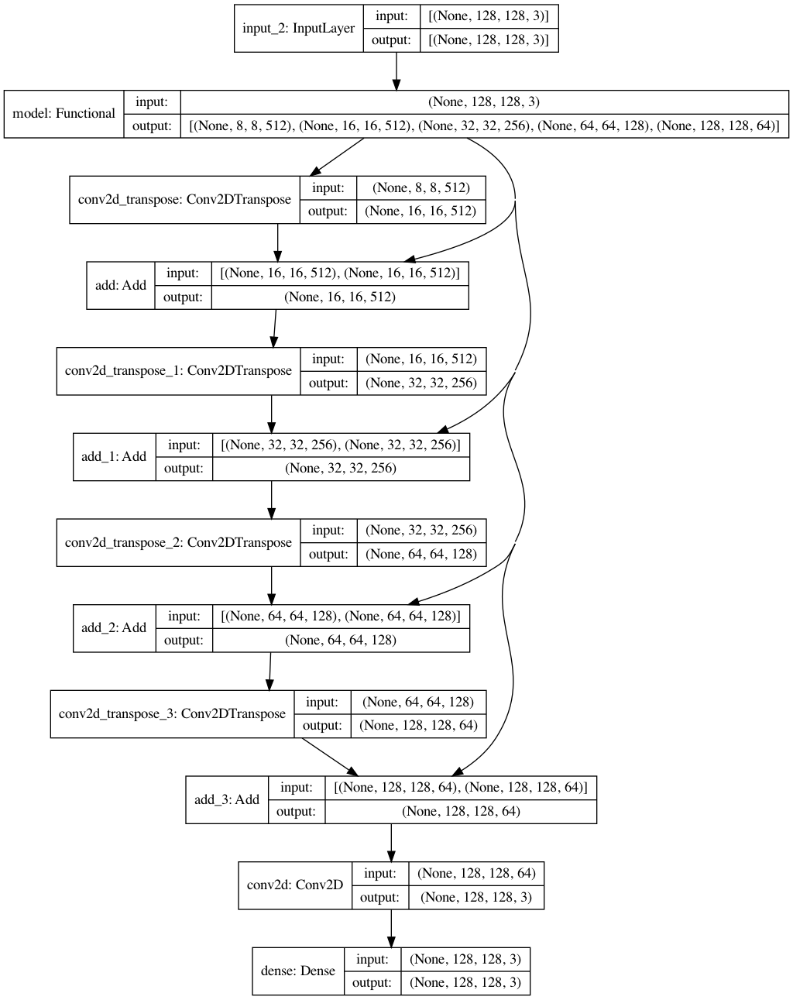

In [25]:
# 모델 구조 시각화
tf.keras.utils.plot_model(unet_model,show_shapes=True)

In [26]:
# 모델 요약
unet_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
model (Functional)              [(None, 8, 8, 512),  14714688    input_2[0][0]                    
__________________________________________________________________________________________________
conv2d_transpose (Conv2DTranspo (None, 16, 16, 512)  2359808     model[0][0]                      
__________________________________________________________________________________________________
add (Add)                       (None, 16, 16, 512)  0           conv2d_transpose[0][0]           
                                                                 model[0][1]                

In [27]:
# 모델 컴파일 및 훈련
loss_f = tf.losses.SparseCategoricalCrossentropy()
opt = tf.optimizers.Adam(learning_rate)

unet_model.compile(optimizer=opt, loss=loss_f, metrics=['accuracy'])
unet_model.fit(train_ds, batch_size=batch_size, epochs=epoch_num)

Epoch 1/5


Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment


230/230 [==============================] - 394s 2s/step - loss: 1.1382 - accuracy: 0.6720
Epoch 2/5


Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment


230/230 [==============================] - 325s 1s/step - loss: 0.5980 - accuracy: 0.8057
Epoch 3/5


Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment


230/230 [==============================] - 334s 1s/step - loss: 0.5439 - accuracy: 0.8169
Epoch 4/5


Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment


230/230 [==============================] - 335s 1s/step - loss: 0.5237 - accuracy: 0.8208
Epoch 5/5


Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment


230/230 [==============================] - 332s 1s/step - loss: 0.5085 - accuracy: 0.8239


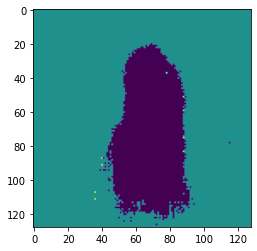

In [28]:
# 1개 배치(16개 이미지)를 선택
img, mask = next(iter(test_ds))

# 모델 예측
pred = unet_model.predict(img)

# 첫번째 이미지 분할 결과를 출력
pred_img=np.argmax(pred[0], -1)
plt.imshow(pred_img)

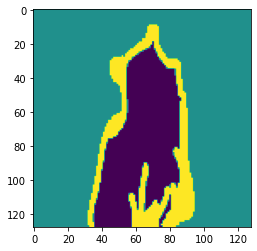

In [29]:
# 첫번째 이미지의 정답 마스크 출력
plt.imshow(np.reshape(mask[0], (128,128)))